In [1]:
# Need to update apocentric distance values in Data.csv
# Need to add first pass (impact prameter) values
import pandas as pd
%matplotlib inline
import tangos
import tangos.examples.mergers as mergers

import numpy as np
import h5py
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
h = 0.6776942783267969

from tangos_halo_module.halo_properties import impact_parameter, ID_to_sim_halo_snap, infall_final_n_particles, infall_final_coordinates, apocentric_distance, disruption_time, accretion_time, orbit_interpolation, infall_velocity, quenching_time, max_sSFR_time, max_mass_time 
from tangos_halo_module.path import get_file_path, get_halo_snap_num, read_file
from tangos_halo_module.halos import ID_to_tangos_halo, get_survivors, get_zombies, get_host, get_survivor_IDs, get_zombie_IDs, blockPrint, enablePrint

In [4]:
data = pd.read_csv('Data100.csv')
ids = data['ID'].to_numpy()
ids

array([  148409610, 14840961090, 14840961101,   148409612, 14840961292,
         148409613,  1484096189,    14840962,  1484096217,  1484096223,
       14840962297,   148409623,  1484096263,  1484096290,    14840963,
        1484096306,   148409636,  1484096380,   148409639,    14840964,
        1484096438,   148409644,   148409648,  1484096563,   148409662,
         148409669,  1484096779,  1484096932,  1480225104,   148027562,
        1480275869,  1480347728,    14803478,  1480384109,  1480384115,
        1480384124,  1480384163,    14803846,  1480384990,  1480456173,
        1480456309,   148045663,  1480512264,    14805124,   148051272,
         148051285,   148051289,   148064011,    14807012,   148070125,
         148070149,   148070165,   148089619,   148097431,   148102421,
         148102429,    14810249,    14811066,   148115210,    14812803,
          14812806,   148153610,   148153614,   148192016,    14824322,
          14829442,   229409610, 22940961327, 22940961381,   229

In [4]:
def velocity_angles(ID=0, interpolate=False, simulation=0, status=0, tangos_halo=0, halo_id=0, snap_num=0, resolution=1000):
    '''
    input params: 
        simulation: h148, h229, h242, h329: string
        key: pre-existing tangos halo property: string
        tangos_halo: 0 or a valid Tangos halo object
        halo_path: 0 or a complete tangos halo address: path or string object
        halo_id: halo id: 0 or string or numeric
        snap_num: 0 or 4 digit simulation snapshot number: string
    output params:
        
    '''
    from scipy.interpolate import CubicSpline
    np.seterr(divide='ignore', invalid='ignore')
    if ID != 0:
        simulation, status, halo_id, snap_num = ID_to_sim_halo_snap(ID=ID)
    #Host
    path = get_file_path(tangos_halo=0, simulation=simulation, status='Host', halo_id='1', snap_num='4096', resolution=resolution)
    with h5py.File(path, 'r') as fh:
        t_Gyr = fh['time_|_Gyr'][:]
        hostMstar = fh['M_star_|_Msol'][:]
        hostVX = fh['VXc_|_km/s'][:]
        hostVY = fh['VYc_|_km/s'][:]
        hostVZ = fh['VZc_|_km/s'][:]
        hostx = fh['Xc_|_kpc'][:]
        hosty = fh['Yc_|_kpc'][:]
        hostz = fh['Zc_|_kpc'][:]
    
    #Satellite
    path = get_file_path(tangos_halo=tangos_halo, simulation=simulation, 
                         status=status, halo_id=halo_id, snap_num=snap_num, resolution=resolution)
    with h5py.File(path, 'r') as f:
        satMstar = f['M_star_|_Msol'][:]
        satVX = f['VXc_|_km/s'][:]
        satVY = f['VYc_|_km/s'][:]
        satVZ = f['VZc_|_km/s'][:]
        satx = f['Xc_|_kpc'][:]
        saty = f['Yc_|_kpc'][:]
        satz = f['Zc_|_kpc'][:]
    
    
    if interpolate==True:
        dummy = [0]*3
        if len(t_Gyr[satMstar!=0])>=2:
            # time
            t = np.linspace(min(t_Gyr[satMstar!=0]), max(t_Gyr[satMstar!=0]), 300)
            # sat x coords
            f = CubicSpline(t_Gyr[satMstar!=0], satx[satMstar!=0]) #fxn
            satx = f(t)
            # sat y coords
            f = CubicSpline(t_Gyr[satMstar!=0], saty[satMstar!=0]) #fxn
            saty = f(t)
            # sat z coords
            f = CubicSpline(t_Gyr[satMstar!=0], satz[satMstar!=0]) #fxn
            satz = f(t)
            # host x coords
            f = CubicSpline(t_Gyr[satMstar!=0], hostx[satMstar!=0]) #fxn
            hostx = f(t)
            # host y coords
            f = CubicSpline(t_Gyr[satMstar!=0], hosty[satMstar!=0]) #fxn
            hosty = f(t)
            # host z coords
            f = CubicSpline(t_Gyr[satMstar!=0], hostz[satMstar!=0]) #fxn
            hostz = f(t)
            # host x cm velocity
            f = CubicSpline(t_Gyr[satMstar!=0], hostVX[satMstar!=0]) #fxn
            hostVX = f(t)
            # host y cm velocity
            f = CubicSpline(t_Gyr[satMstar!=0], hostVY[satMstar!=0]) #fxn
            hostVY = f(t)
            # host z cm velocity
            f = CubicSpline(t_Gyr[satMstar!=0], hostVZ[satMstar!=0]) #fxn
            hostVZ = f(t)
            # sat x cm velocity
            f = CubicSpline(t_Gyr[satMstar!=0], satVX[satMstar!=0]) #fxn
            satVX = f(t)
            # sat y cm velocity
            f = CubicSpline(t_Gyr[satMstar!=0], satVY[satMstar!=0]) #fxn
            satVY = f(t)
            # sat z cm velocity
            f = CubicSpline(t_Gyr[satMstar!=0], satVZ[satMstar!=0]) #fxn
            satVZ = f(t)
        else:
            return np.array(dummy), np.array(dummy)
    
    #|v_{sat}|
    velocity = (satVX**2 + satVY**2 + satVZ**2)**(1/2)
    #|v_{sat} - v_{host}|
    Vx = satVX - hostVX
    Vy = satVY - hostVY
    Vz = satVZ - hostVZ
    X = satx - hostx
    Y = saty - hosty
    Z = satz - hostz
    R = (X**2 + Y**2 + Z**2)**(1/2)
    
    cosTheta = Z/R # Vertical angle away from z
    Theta = np.arccos(cosTheta) # in Radians
    m = R/np.sin(Theta)
    
    tanPhi = Y/X
    Phi = np.arctan(tanPhi)
    XTheta = m*np.cos(Phi)-satx
    YTheta = m*np.sin(Phi)-saty
    ZTheta = -satz
    
    XPhi = Z*np.tan(Theta)/np.cos(Phi)
    YPhi = -hosty
    ZPhi = Z
    
    vRelative = (Vx**2 + Vy**2 + Vz**2)**(1/2)
    vRadial = abs((Vx*X + Vy*Y + Vz*Z)/(X**2 + Y**2 + Z**2)**(1/2)) #v.r/|r|  #|v_{rad}|
    vTangential = (vRelative**2 - vRadial**2)**(1/2) #|v_{tan}|
    
    vTheta = abs((Vx*XTheta + Vy*YTheta + Vz*ZTheta)/(XTheta**2 + YTheta**2 + ZTheta**2)**(1/2))
    vPhi = abs((Vx*XPhi + Vy*YPhi + Vz*ZPhi)/(XPhi**2 + YPhi**2 + ZPhi**2)**(1/2))
    vTotal = np.sqrt(vRadial**2 + vTheta**2 + vPhi**2)
    t_accretion = accretion_time(ID=ID, simulation=simulation, status=status, 
                                 tangos_halo=tangos_halo, halo_id=halo_id, 
                                 snap_num=snap_num, category='stars', resolution=resolution)[0]
    #rs_vectors=np.empty([3, 1])
    #vs_vectors=np.empty([3, 1])
    #for i in range(0, len(X)):
    #    rs_vectors=np.vstack((rs_vectors, [X[i], Y[i], Z[i]]))
    #    vs_vectors=np.vstack((vs_vectors, [Vx[i], Vy[i], Vz[i]]))
    rs_vectors = np.array([[X],[Y],[Z]])
    #print(rs_vectors)
    rs_vectors = np.vstack((X,Y,Z)).T
    vs_vectors = np.vstack((Vx,Vy,Vz)).T
    #print(rs_vectors)
    Ls = np.cross(rs_vectors, vs_vectors)
    Lh = np.zeros(np.shape(Ls))
    Lh[:,2]=1
    cosThetaL = (Ls*Lh).sum(1)/np.sqrt((Ls*Ls).sum(1))
#     orbit_offset = np.tan(np.arccos(cosThetaL))*R
    ThetaL = np.arccos(cosThetaL)
    ThetaL[np.isnan(ThetaL)]=0
    zThetaL = R*np.sin(ThetaL)
#    print(thetaL[-1], R[-1])
#     print('length of X', len(X))
#     print('length of costhetaL', len(cosThetaL))
#     print(cosThetaL)
    if interpolate==True:
        #velocities at infall
        return zThetaL, t #vTheta[t>=t_accretion], vPhi[t>=t_accretion], vRadial[t>=t_accretion], t[t>=t_accretion], Theta[t>=t_accretion]
    else:
        t_Gyr = np.array([round(t, 3) for t in t_Gyr])
        infall_Theta = Theta[t_Gyr==t_accretion][0]
        infall_Phi = Phi[t_Gyr==t_accretion][0]
        infall_vTheta = vTheta[t_Gyr==t_accretion][0]
        infall_vPhi = vPhi[t_Gyr==t_accretion][0]
        infall_vRadial = vRadial[t_Gyr==t_accretion][0]
        infall_vTotal = vTotal[t_Gyr==t_accretion][0]
        infall_zThetaL = zThetaL[t_Gyr==t_accretion][0]
        return infall_Theta, infall_Phi, infall_vTheta, infall_vPhi, infall_vRadial, infall_vTotal, infall_zThetaL


# infall_Theta = [velocity_angles(ID=idx, resolution=100)[0] for idx in ids]
# infall_Phi = [velocity_angles(ID=idx, resolution=100)[1] for idx in ids]
# infall_vRadial = [velocity_angles(ID=idx, resolution=100)[2] for idx in ids]
# infall_vRelative = [velocity_angles(ID=idx, resolution=100)[3] for idx in ids]
# for idx in ids:
#     print(velocity_angles(ID=idx, interpolate=True, resolution=100))

In [8]:
def mass_loss(ID=0, interpolate=False, simulation=0, status=0, tangos_halo=0, halo_id=0, snap_num=0, resolution=1000):
    '''
    input params: 
        simulation: h148, h229, h242, h329: string
        key: pre-existing tangos halo property: string
        tangos_halo: 0 or a valid Tangos halo object
        halo_path: 0 or a complete tangos halo address: path or string object
        halo_id: halo id: 0 or string or numeric
        snap_num: 0 or 4 digit simulation snapshot number: string
    output params:
        
    '''
    from scipy.interpolate import CubicSpline
    np.seterr(divide='ignore', invalid='ignore')
    if ID != 0:
        simulation, status, halo_id, snap_num = ID_to_sim_halo_snap(ID=ID)
    #Host
    path = get_file_path(tangos_halo=0, simulation=simulation, status='Host', halo_id='1', snap_num='4096', resolution=resolution)
    with h5py.File(path, 'r') as fh:
        hostMstar = fh['M_star_|_Msol'][:]
    #Satellite
    path = get_file_path(tangos_halo=tangos_halo, simulation=simulation, 
                         status=status, halo_id=halo_id, snap_num=snap_num, resolution=resolution)
    with h5py.File(path, 'r') as f:
        t_Gyr = f['time_|_Gyr'][:]
        satMstar = f['M_star_|_Msol'][:]
        satMvir = f['Mvir_|_Msol'][:]
        satMgas = f['M_gas_|_Msol'][:]
    t_accretion = accretion_time(ID=ID, simulation=simulation, status=status, 
                                 tangos_halo=tangos_halo, halo_id=halo_id, 
                                 snap_num=snap_num, category='stars', resolution=resolution)[0]
    t_Gyr = np.array([round(t, 3) for t in t_Gyr])
    infall_satMstar = satMstar[t_Gyr==t_accretion][0]
    infall_satMvir = satMvir[t_Gyr==t_accretion][0]
    infall_satMgas = satMgas[t_Gyr==t_accretion][0]
    
    satMvir[satMstar==hostMstar]=0
    satMgas[satMstar==hostMstar]=0
    satMstar[satMstar==hostMstar]=0
    
    S=satMstar/infall_satMstar
    D=satMvir/infall_satMvir
    if infall_satMgas == 0:
        G=np.zeros(len(t_Gyr))
    elif infall_satMgas>0:
        G=satMgas/infall_satMgas
    
    S[D>=4]=0
    G[D>=4]=0
    D[D>=4]=0

    if interpolate==True:
        dummy = [0]*3
        if len(t_Gyr[satMstar!=0])>=2:
            # [(satMstar!=0) & (satMstar!=hostMstar)]
            # time
            t = np.linspace(min(t_Gyr), max(t_Gyr), 300)
            # sat y coords
            f = CubicSpline(t_Gyr, D) #fxn
            D = f(t)
            # sat z coords
            f = CubicSpline(t_Gyr, G) #fxn
            G = f(t)
            f = CubicSpline(t_Gyr, S) #fxn
            S = f(t)
            t_Gyr = t
        else:
            return np.array(dummy), np.array(dummy), np.array(dummy), np.array(dummy)
        
    return t_Gyr, S, D, G
mass_loss(ID=148409610270, interpolate=True, resolution=100)

(array([ 0.477     ,  0.52156187,  0.56612375,  0.61068562,  0.65524749,
         0.69980936,  0.74437124,  0.78893311,  0.83349498,  0.87805686,
         0.92261873,  0.9671806 ,  1.01174247,  1.05630435,  1.10086622,
         1.14542809,  1.18998997,  1.23455184,  1.27911371,  1.32367559,
         1.36823746,  1.41279933,  1.4573612 ,  1.50192308,  1.54648495,
         1.59104682,  1.6356087 ,  1.68017057,  1.72473244,  1.76929431,
         1.81385619,  1.85841806,  1.90297993,  1.94754181,  1.99210368,
         2.03666555,  2.08122742,  2.1257893 ,  2.17035117,  2.21491304,
         2.25947492,  2.30403679,  2.34859866,  2.39316054,  2.43772241,
         2.48228428,  2.52684615,  2.57140803,  2.6159699 ,  2.66053177,
         2.70509365,  2.74965552,  2.79421739,  2.83877926,  2.88334114,
         2.92790301,  2.97246488,  3.01702676,  3.06158863,  3.1061505 ,
         3.15071237,  3.19527425,  3.23983612,  3.28439799,  3.32895987,
         3.37352174,  3.41808361,  3.46264548,  3.5

In [4]:
pd.set_option("display.max_rows", None, "display.max_columns", None)
# data['infall_Theta']=infall_Theta
# data['infall_Phi']=infall_Phi
# # data['infall_vRadial']=infall_vRadial
# # data['infall_vRelative']=infall_vRelative
# data.to_csv('Data100.csv', index=False)
data

,ID,Simulation,Status,infall_mass,time_infall,infall_mass_ratio,infall_ID,time_quench,max_sSFR,time_max_sSFR,time_disruption,infall_relative_velocity,infall_radial_velocity,infall_tangential_velocity,max_stellarmass,time_max_stellarmass,time_closest_approch,distance_closest_approach_hostRvir,distance_closest_approach_pkpc,infall_x,infall_y,infall_z,infall_distance,infall_phi_z,infall_z_away,final_x,final_y,final_z,final_distance,final_phi_z,final_z_away,infall_n_dm,infall_n_star,infall_n_gas,final_n_dm,final_n_star,final_n_gas,impact_parameter_kpc,impact_parameter_hostRvir,time_impact,infall_vTheta,infall_vPhi,infall_vRadial,infall_vRelative,infall_Theta,infall_Phi
0,148409610,h148,Survivor,2.334786e+07,8.198,4.310130e-04,148243210,-1.000,NaN,NaN,-1.000000,236.949764,-49.322152,231.759608,7.477611e+07,9.060013,13.369817,0.471640,124.792962,76.512420,132.289877,-70.289024,168.212095,2.001884,152.822649,20.976533,125.426582,-47.773369,135.846006,1.930154,127.168559,504066,9808,71063,240591,26111,46997,166.424348,0.778184,9.060,25.341153,158.582337,49.322152,236.949764,2.001884,1.046434
1,148409610270,h148,Survivor,1.988138e+05,13.370,2.322107e-06,14839689900,13.370,NaN,NaN,-1.000000,199.169639,114.836202,162.730427,1.988138e+05,13.369817,13.369817,0.279822,74.039241,-5.607718,-3.690210,-73.734286,74.039241,3.050800,6.712984,49.411688,27.239158,-78.823368,96.936113,2.520336,56.422395,0,88,0,0,83,0,74.039241,0.279822,13.370,42.233542,64.311505,114.836202,199.169639,3.050800,0.582020
2,14840961090,h148,Survivor,2.256329e+03,6.474,6.050906e-08,1481920930,0.642,NaN,NaN,-1.000000,269.972251,-117.638735,242.994124,2.796668e+03,0.642428,12.507856,0.260780,66.569741,65.784892,57.852703,-14.590757,88.811471,1.735834,87.604722,106.466291,100.093621,-9.752360,146.454473,1.637435,146.129409,1927,1,0,1022,1,0,88.386981,0.534849,6.905,13.194239,202.872766,117.638735,269.972251,1.735834,0.721329
3,14840961101,h148,Survivor,4.742965e+04,8.609,8.192135e-07,1482554630,4.282,NaN,NaN,-1.000000,198.400577,-182.710404,77.328503,4.838934e+04,6.905111,9.060013,0.200703,42.922935,71.093704,43.308511,-122.016207,147.708824,2.542875,83.246272,47.995458,-146.392205,164.635807,225.475477,0.752223,154.059215,2536,21,0,989,20,0,42.922935,0.200703,9.060,59.617733,59.953663,182.710404,198.400577,2.542875,0.547139
4,148409612,h148,Survivor,2.334786e+07,8.198,4.310130e-04,148243210,9.491,NaN,NaN,-1.000000,236.949764,-49.322152,231.759608,7.477611e+07,9.060013,9.060013,0.778184,166.424348,76.512420,132.289877,-70.289024,168.212095,2.001884,152.822649,-52.329940,-255.495267,114.102768,284.667694,1.158376,260.799260,504066,9808,71063,212293,21027,342,166.424348,0.778184,9.060,25.341153,158.582337,49.322152,236.949764,2.001884,1.046434
5,14840961292,h148,Survivor,2.799243e+05,3.888,2.846410e-05,148115279,3.888,NaN,NaN,-1.000000,199.796895,-120.348841,159.483403,2.844432e+05,3.733365,8.198053,0.244127,48.109889,10.061158,23.667461,-76.949403,81.133139,2.819054,25.717224,2.303969,75.024882,117.352543,139.304202,0.569039,75.060250,34109,114,2140,761,89,0,53.680477,0.472050,4.282,68.251002,115.171796,120.348841,199.796895,2.819054,1.168837
6,148409613,h148,Survivor,5.701916e+06,13.801,6.456135e-05,148409613,-1.000,NaN,NaN,-1.000000,224.560079,-47.444220,219.490945,5.701916e+06,13.800797,13.800797,1.025286,275.318070,-178.582915,-50.983122,-203.245918,275.318070,2.401227,185.717894,-178.582915,-50.983122,-203.245918,275.318070,2.401227,185.717894,203901,2459,4193,203901,2459,4193,275.318070,1.025286,-13.801,127.154523,187.794123,47.444220,224.560079,2.401227,0.278090
7,1484096189,h148,Survivor,1.002513e+05,5.868,3.131052e-06,1481740150,2.595,NaN,NaN,-1.000000,253.720355,-201.673831,153.953514,1.135077e+05,2.369716,9.060013,0.269057,57.541228,-54.116822,66.828586,61.329772,105.622115,0.951266,85.992385,-90.034224,-55.103538,173.550524,203.131351,0.546448,105.558332,14442,44,131,6607,44,0,72.050555,0.457663,6.474,116.513100,244.301963,201.673831,253.720355,0.951266,-0.890117

Text(0, 0.5, '$v_\\Theta$ [km/s]')

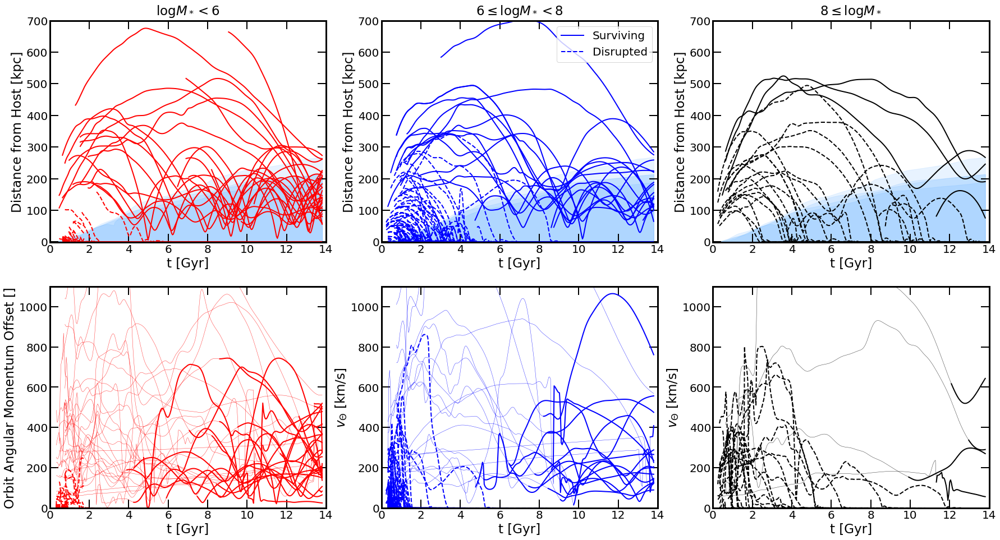

In [7]:
np.seterr(divide='ignore', invalid='ignore')
data = pd.read_csv('Data100.csv')
status = data['Status'].to_numpy()
ids = data['ID'].to_numpy()
infall_Mstar = data['infall_mass'].to_numpy()
t_infall = data['time_infall'].to_numpy()
t_disrupt = data['time_disruption'].to_numpy()

fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(30, 16))
fig.set_facecolor('w')
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
plt.setp(ax2.spines.values(), linewidth=3)
plt.setp(ax3.spines.values(), linewidth=3)
plt.setp(ax4.spines.values(), linewidth=3)
plt.setp(ax5.spines.values(), linewidth=3)
plt.setp(ax6.spines.values(), linewidth=3)

for sim in ['h148', 'h229', 'h242', 'h329']:
    path = get_file_path(tangos_halo=0, simulation=sim, status='Host', halo_id='1', snap_num='4096')
    with h5py.File(path, 'r') as fh:
        t_Gyr = fh['time_|_Gyr'][:]
        hostRvir = fh['Rvir_|_kpc'][:]
    ax1.fill_between(t_Gyr, hostRvir, color='dodgerblue', alpha=0.1, lw=1)
    ax2.fill_between(t_Gyr, hostRvir, color='dodgerblue', alpha=0.1, lw=1)
    ax3.fill_between(t_Gyr, hostRvir, color='dodgerblue', alpha=0.1, lw=1)
count=0    
for idx in ids[(status=='Survivor')]:
    k, (t, x, y, z, Rvir) = orbit_interpolation(ID=idx, resolution=100)
    t=np.array(t)
    x=np.array(x)
    y=np.array(y)
    z=np.array(z)
    
    R = (x**2 + y**2 + z**2)**(1/2)
    thetaL, t_Gyr = velocity_angles(ID=idx, interpolate=True, resolution=100)    
#    print(len(t),len(t_Gyr),t[-1],t_Gyr[-1])
    if len(t) == len(t_Gyr):
        z_offset = R*thetaL
    else:
        z_offset = thetaL*0

    if np.log10(infall_Mstar[ids==idx])<6:
        ax1.plot(t, R, lw=2, alpha=1, c='r')
        ax4.plot(t_Gyr, z_offset, lw=0.5, alpha=0.8, c='r')
        ax4.plot(t_Gyr[t_Gyr>=t_infall[ids==idx]], z_offset[t_Gyr>=t_infall[ids==idx]], lw=2, alpha=1, c='r')
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        if count==0:
            ax2.plot(t, R, lw=2, alpha=1, c='b', label='Surviving')
            count+=1
        else:
            ax2.plot(t, R, lw=2, alpha=1, c='b')
            ax5.plot(t_Gyr, z_offset, lw=0.5, alpha=0.8, c='b')
            ax5.plot(t_Gyr[t_Gyr>=t_infall[ids==idx]], z_offset[t_Gyr>=t_infall[ids==idx]], lw=2, alpha=1, c='b')
    elif np.log10(infall_Mstar[ids==idx])>=8:
        ax3.plot(t, R, lw=2, alpha=1, c='k')
        ax6.plot(t_Gyr, z_offset, lw=0.5, alpha=0.8, c='k')
        ax6.plot(t_Gyr[t_Gyr>=t_infall[ids==idx]], z_offset[t_Gyr>=t_infall[ids==idx]], lw=2, alpha=1, c='k')


count=0
for idz in ids[(status=='Zombie')]:
    k, (t, x, y, z, Rvir) = orbit_interpolation(ID=idz, resolution=100)
    t=np.array(t)
    x=np.array(x)
    y=np.array(y)
    z=np.array(z)
    R = (x**2 + y**2 + z**2)**(1/2)

    thetaL, t_Gyr = velocity_angles(ID=idz, interpolate=True, resolution=100)
    if len(t) == len(t_Gyr):
        z_offset = R*thetaL
    else:
        z_offset = thetaL*0

    if np.log10(infall_Mstar[ids==idz])<6:
        ax1.plot(t, R, lw=2, alpha=1, c='r', ls='--')
        ax4.plot(t_Gyr[t_Gyr<=t_disrupt[ids==idz]], z_offset[t_Gyr<=t_disrupt[ids==idz]], lw=2, alpha=1, c='r', ls='--')
    elif np.log10(infall_Mstar[ids==idz])>=6 and np.log10(infall_Mstar[ids==idz])<8:
        if count==0:
            ax2.plot(t, R, lw=2, alpha=1, c='b', ls='--', label='Disrupted')
            count+=1
        else:
            ax2.plot(t, R, lw=2, alpha=1, c='b', ls='--')
            ax5.plot(t_Gyr[t_Gyr<=t_disrupt[ids==idz]], z_offset[t_Gyr<=t_disrupt[ids==idz]], lw=2, alpha=1, c='b', ls='--')
    elif np.log10(infall_Mstar[ids==idz])>=8:
        ax3.plot(t, R, lw=2, alpha=1, c='k', ls='--')
        ax6.plot(t_Gyr[t_Gyr<=t_disrupt[ids==idz]], z_offset[t_Gyr<=t_disrupt[ids==idz]], lw=2, alpha=1, c='k', ls='--')
        
ax1.set_xlim(0, 14)
ax1.set_ylim(-1, 700)
# ax1.set_xscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax1.tick_params(which='major', length=15, width=2, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('$\log M_* < 6$', fontsize=23, pad=10)
ax1.set_xlabel('t [Gyr]', fontsize=23)
ax1.set_ylabel('Distance from Host [kpc]', fontsize=23)

ax2.set_xlim(0, 14)
ax2.set_ylim(-1, 700)
# ax1.set_xscale('log')
ax2.legend(loc='best', fontsize=20, frameon=True)
ax2.tick_params(which='major', length=15, width=2, labelsize=15)
ax2.tick_params(which='minor', length=8, width=2, labelsize=15)
ax2.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax2.set_title('$6 \leq \log M_* < 8$', fontsize=23, pad=10)
ax2.set_xlabel('t [Gyr]', fontsize=23)
ax2.set_ylabel('Distance from Host [kpc]', fontsize=23)

ax3.set_xlim(0, 14)
ax3.set_ylim(-1, 700)
# ax1.set_xscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax3.tick_params(which='major', length=15, width=2, labelsize=15)
ax3.tick_params(which='minor', length=8, width=2, labelsize=15)
ax3.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax3.set_title('$8 \leq \log M_*$', fontsize=23, pad=10)
ax3.set_xlabel('t [Gyr]', fontsize=23)
ax3.set_ylabel('Distance from Host [kpc]', fontsize=23)

ax4.set_xlim(0, 14)
ax4.set_ylim(-1, 1100)
ax4.tick_params(which='major', length=15, width=2, labelsize=15)
ax4.tick_params(which='minor', length=8, width=2, labelsize=15)
ax4.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax4.set_xlabel('t [Gyr]', fontsize=23)
ax4.set_ylabel('Orbit Angular Momentum Offset []', fontsize=23)

ax5.set_xlim(0, 14)
ax5.set_ylim(-1, 1100)
ax5.tick_params(which='major', length=15, width=2, labelsize=15)
ax5.tick_params(which='minor', length=8, width=2, labelsize=15)
ax5.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax5.set_xlabel('t [Gyr]', fontsize=23)
ax5.set_ylabel('$v_\Theta$ [km/s]', fontsize=23)

ax6.set_xlim(0, 14)
ax6.set_ylim(-1, 1100)
ax6.tick_params(which='major', length=15, width=2, labelsize=15)
ax6.tick_params(which='minor', length=8, width=2, labelsize=15)
ax6.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax6.set_xlabel('t [Gyr]', fontsize=23)
ax6.set_ylabel('$v_\Theta$ [km/s]', fontsize=23)

# cumulative histogram of infall stellar masses (like satellite luminosity function) for all satellites

Text(0, 0.5, 'Angular Momentum Offset [kpc]')

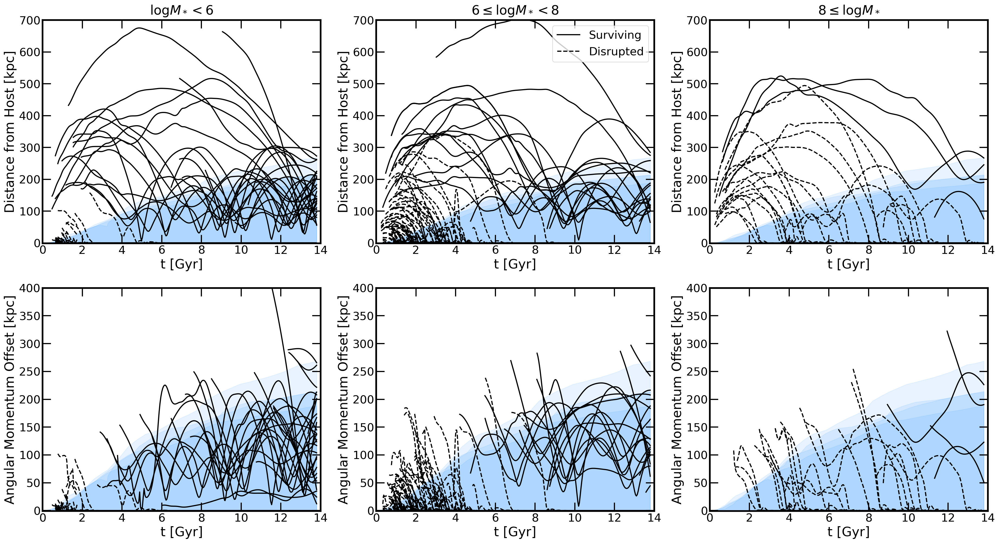

In [6]:
np.seterr(divide='ignore', invalid='ignore')
data = pd.read_csv('Data100.csv')
status = data['Status'].to_numpy()
ids = data['ID'].to_numpy()
infall_Mstar = data['infall_mass'].to_numpy()
t_infall = data['time_infall'].to_numpy()
t_disrupt = data['time_disruption'].to_numpy()

fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, sharex='none', sharey='none', figsize=(30, 16))
fig.set_facecolor('w')
fig.set_dpi(150)
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
plt.setp(ax2.spines.values(), linewidth=3)
plt.setp(ax3.spines.values(), linewidth=3)
plt.setp(ax4.spines.values(), linewidth=3)
plt.setp(ax5.spines.values(), linewidth=3)
plt.setp(ax6.spines.values(), linewidth=3)

for sim in ['h148', 'h229', 'h242', 'h329']:
    path = get_file_path(tangos_halo=0, simulation=sim, status='Host', halo_id='1', snap_num='4096')
    with h5py.File(path, 'r') as fh:
        t_Gyr = fh['time_|_Gyr'][:]
        hostRvir = fh['Rvir_|_kpc'][:]
    ax1.fill_between(t_Gyr, hostRvir, color='dodgerblue', alpha=0.1, lw=1)
    ax2.fill_between(t_Gyr, hostRvir, color='dodgerblue', alpha=0.1, lw=1)
    ax3.fill_between(t_Gyr, hostRvir, color='dodgerblue', alpha=0.1, lw=1)
    ax4.fill_between(t_Gyr, hostRvir, color='dodgerblue', alpha=0.1, lw=1)
    ax5.fill_between(t_Gyr, hostRvir, color='dodgerblue', alpha=0.1, lw=1)
    ax6.fill_between(t_Gyr, hostRvir, color='dodgerblue', alpha=0.1, lw=1)
count=0    
for idx in ids[(status=='Survivor')]:
    k, (t, x, y, z, Rvir) = orbit_interpolation(ID=idx, resolution=100)
    t=np.array(t)
    x=np.array(x)
    y=np.array(y)
    z=np.array(z)
    
    R = (x**2 + y**2 + z**2)**(1/2)
    z_offset, t_Gyr = velocity_angles(ID=idx, interpolate=True, resolution=100)    

    if np.log10(infall_Mstar[ids==idx])<6:
        ax1.plot(t, R, lw=2, alpha=1, c='k')
#         ax4.plot(t_Gyr, z_offset, lw=0.5, alpha=0.8, c='k')
        ax4.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx]-1)], z_offset[(t_Gyr>=t_infall[ids==idx]-1)], lw=2, alpha=1, c='k')
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        if count==0:
            ax2.plot(t, R, lw=2, alpha=1, c='k', label='Surviving')
            count+=1
        else:
            ax2.plot(t, R, lw=2, alpha=1, c='k')
#             ax5.plot(t_Gyr, z_offset, lw=0.5, alpha=0.8, c='k')
            ax5.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx]-1)], z_offset[(t_Gyr>=t_infall[ids==idx]-1)], lw=2, alpha=1, c='k')
    elif np.log10(infall_Mstar[ids==idx])>=8:
        ax3.plot(t, R, lw=2, alpha=1, c='k')
#         ax6.plot(t_Gyr, z_offset, lw=0.5, alpha=0.8, c='k')
        ax6.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx]-1)], z_offset[(t_Gyr>=t_infall[ids==idx]-1)], lw=2, alpha=1, c='k')

# [(t_Gyr>=t_infall[ids==idx]) & (z_offset<=300)]
count=0
for idx in ids[(status=='Zombie')]:
    k, (t, x, y, z, Rvir) = orbit_interpolation(ID=idx, resolution=100)
    t=np.array(t)
    x=np.array(x)
    y=np.array(y)
    z=np.array(z)
    R = (x**2 + y**2 + z**2)**(1/2)

    z_offset, t_Gyr = velocity_angles(ID=idx, interpolate=True, resolution=100)
    if np.log10(infall_Mstar[ids==idx])<6:
        ax1.plot(t, R, lw=2, alpha=1, c='k', ls='--')
        ax4.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx]-1)], z_offset[(t_Gyr>=t_infall[ids==idx]-1)], lw=2, alpha=1, c='k', ls='--')
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        if count==0:
            ax2.plot(t, R, lw=2, alpha=1, c='k', ls='--', label='Disrupted')
            count+=1
        else:
            ax2.plot(t, R, lw=2, alpha=1, c='k', ls='--')
            ax5.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx]-1)], z_offset[(t_Gyr>=t_infall[ids==idx]-1)], lw=2, alpha=1, c='k', ls='--')
    elif np.log10(infall_Mstar[ids==idx])>=8:
        ax3.plot(t, R, lw=2, alpha=1, c='k', ls='--')
        ax6.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx]-1)], z_offset[(t_Gyr>=t_infall[ids==idx]-1)], lw=2, alpha=1, c='k', ls='--')
# [(z_offset<=300)]
ax1.set_xlim(0, 14)
ax1.set_ylim(-1, 700)

# ax1.set_xscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax1.tick_params(which='major', length=15, width=2, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('$\log M_* < 6$', fontsize=23, pad=10)
ax1.set_xlabel('t [Gyr]', fontsize=23)
ax1.set_ylabel('Distance from Host [kpc]', fontsize=23)

ax2.set_xlim(0, 14)
ax2.set_ylim(-1, 700)
# ax1.set_xscale('log')
ax2.legend(loc='upper right', fontsize=20, frameon=True)
ax2.tick_params(which='major', length=15, width=2, labelsize=15)
ax2.tick_params(which='minor', length=8, width=2, labelsize=15)
ax2.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax2.set_title('$6 \leq \log M_* < 8$', fontsize=23, pad=10)
ax2.set_xlabel('t [Gyr]', fontsize=23)
ax2.set_ylabel('Distance from Host [kpc]', fontsize=23)

ax3.set_xlim(0, 14)
ax3.set_ylim(-1, 700)
# ax1.set_xscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax3.tick_params(which='major', length=15, width=2, labelsize=15)
ax3.tick_params(which='minor', length=8, width=2, labelsize=15)
ax3.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax3.set_title('$8 \leq \log M_*$', fontsize=23, pad=10)
ax3.set_xlabel('t [Gyr]', fontsize=23)
ax3.set_ylabel('Distance from Host [kpc]', fontsize=23)

ax4.set_xlim(0, 14)
ax4.set_ylim(-1, 400)
ax4.tick_params(which='major', length=15, width=2, labelsize=15)
ax4.tick_params(which='minor', length=8, width=2, labelsize=15)
ax4.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax4.set_xlabel('t [Gyr]', fontsize=23)
ax4.set_ylabel('Angular Momentum Offset [kpc]', fontsize=23)

ax5.set_xlim(0, 14)
ax5.set_ylim(-1, 400)
ax5.tick_params(which='major', length=15, width=2, labelsize=15)
ax5.tick_params(which='minor', length=8, width=2, labelsize=15)
ax5.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax5.set_xlabel('t [Gyr]', fontsize=23)
ax5.set_ylabel('Angular Momentum Offset [kpc]', fontsize=23)

ax6.set_xlim(0, 14)
ax6.set_ylim(-1, 400)
ax6.tick_params(which='major', length=15, width=2, labelsize=15)
ax6.tick_params(which='minor', length=8, width=2, labelsize=15)
ax6.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax6.set_xlabel('t [Gyr]', fontsize=23)
ax6.set_ylabel('Angular Momentum Offset [kpc]', fontsize=23)

Text(0, 0.5, 'Angular Momentum Offset [kpc]')

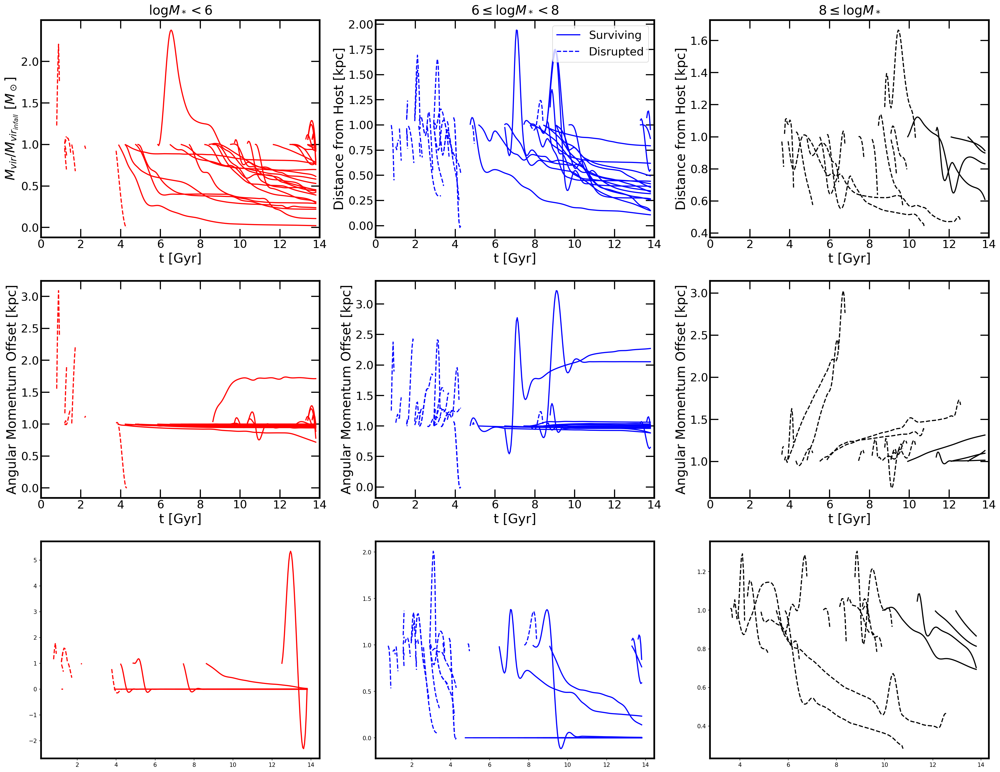

In [7]:
np.seterr(divide='ignore', invalid='ignore')
data = pd.read_csv('Data100.csv')
status = data['Status'].to_numpy()
ids = data['ID'].to_numpy()
infall_Mstar = data['infall_mass'].to_numpy()
t_infall = data['time_infall'].to_numpy()
t_disrupt = data['time_disruption'].to_numpy()

fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9)) = plt.subplots(3, 3, sharex='none', sharey='none', figsize=(30, 24))
fig.set_facecolor('w')
fig.set_dpi(150)
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
plt.setp(ax2.spines.values(), linewidth=3)
plt.setp(ax3.spines.values(), linewidth=3)
plt.setp(ax4.spines.values(), linewidth=3)
plt.setp(ax5.spines.values(), linewidth=3)
plt.setp(ax6.spines.values(), linewidth=3)
plt.setp(ax7.spines.values(), linewidth=3)
plt.setp(ax8.spines.values(), linewidth=3)
plt.setp(ax9.spines.values(), linewidth=3)


count=0    
for idx in ids[(status=='Survivor')]:
#     print(idx)
    t_Gyr, star, dm, gas = mass_loss(ID=idx, interpolate=True, resolution=100)    

    if np.log10(infall_Mstar[ids==idx])<6:
        ax1.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx])], dm[(t_Gyr>=t_infall[ids==idx])], lw=2, alpha=1, c='r')
        ax4.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx])], star[(t_Gyr>=t_infall[ids==idx])], lw=2, alpha=1, c='r')
        ax7.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx])], gas[(t_Gyr>=t_infall[ids==idx])], lw=2, alpha=1, c='r')
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        if count==0:
            ax2.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx])], dm[(t_Gyr>=t_infall[ids==idx])], lw=2, alpha=1, c='b', label='Surviving')
            count+=1
        else:
            ax2.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx])], dm[(t_Gyr>=t_infall[ids==idx])], lw=2, alpha=1, c='b')
            ax5.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx])], star[(t_Gyr>=t_infall[ids==idx])], lw=2, alpha=1, c='b')
            ax8.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx])], gas[(t_Gyr>=t_infall[ids==idx])], lw=2, alpha=1, c='b')
    elif np.log10(infall_Mstar[ids==idx])>=8:
        ax3.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx])], dm[(t_Gyr>=t_infall[ids==idx])], lw=2, alpha=1, c='k')
        ax6.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx])], star[(t_Gyr>=t_infall[ids==idx])], lw=2, alpha=1, c='k')
        ax9.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx])], gas[(t_Gyr>=t_infall[ids==idx])], lw=2, alpha=1, c='k')


count=0
for idx in ids[(status=='Zombie')]:
    t_Gyr, star, dm, gas = mass_loss(ID=idx, interpolate=True, resolution=100)    

    if np.log10(infall_Mstar[ids==idx])<6:
        ax1.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx]) & (t_Gyr<=t_disrupt[ids==idx])], dm[(t_Gyr>=t_infall[ids==idx]) & (t_Gyr<=t_disrupt[ids==idx])], ls='--', lw=2, alpha=1, c='r')
        ax4.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx]) & (t_Gyr<=t_disrupt[ids==idx])], star[(t_Gyr>=t_infall[ids==idx]) & (t_Gyr<=t_disrupt[ids==idx])], ls='--', lw=2, alpha=1, c='r')
        ax7.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx]) & (t_Gyr<=t_disrupt[ids==idx])], gas[(t_Gyr>=t_infall[ids==idx]) & (t_Gyr<=t_disrupt[ids==idx])], ls='--', lw=2, alpha=1, c='r')
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        if count==0:
            ax2.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx]) & (t_Gyr<=t_disrupt[ids==idx])], dm[(t_Gyr>=t_infall[ids==idx]) & (t_Gyr<=t_disrupt[ids==idx])], ls='--', lw=2, alpha=1, c='b', label='Disrupted')
            count+=1
        else:
            ax2.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx]) & (t_Gyr<=t_disrupt[ids==idx])], dm[(t_Gyr>=t_infall[ids==idx]) & (t_Gyr<=t_disrupt[ids==idx])], ls='--', lw=2, alpha=1, c='b')
            ax5.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx]) & (t_Gyr<=t_disrupt[ids==idx])], star[(t_Gyr>=t_infall[ids==idx]) & (t_Gyr<=t_disrupt[ids==idx])], ls='--', lw=2, alpha=1, c='b')
            ax8.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx]) & (t_Gyr<=t_disrupt[ids==idx])], gas[(t_Gyr>=t_infall[ids==idx]) & (t_Gyr<=t_disrupt[ids==idx])], ls='--', lw=2, alpha=1, c='b')
    elif np.log10(infall_Mstar[ids==idx])>=8:
        ax3.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx]) & (t_Gyr<=t_disrupt[ids==idx])], dm[(t_Gyr>=t_infall[ids==idx]) & (t_Gyr<=t_disrupt[ids==idx])], ls='--', lw=2, alpha=1, c='k')
        ax6.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx]) & (t_Gyr<=t_disrupt[ids==idx])], star[(t_Gyr>=t_infall[ids==idx]) & (t_Gyr<=t_disrupt[ids==idx])], ls='--', lw=2, alpha=1, c='k')
        ax9.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx]) & (t_Gyr<=t_disrupt[ids==idx])], gas[(t_Gyr>=t_infall[ids==idx]) & (t_Gyr<=t_disrupt[ids==idx])], ls='--', lw=2, alpha=1, c='k')

ax1.set_xlim(0, 14)
# ax1.set_ylim(-1, 700)
# ax1.set_xscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax1.tick_params(which='major', length=15, width=2, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('$\log M_* < 6$', fontsize=23, pad=10)
ax1.set_xlabel('t [Gyr]', fontsize=23)
ax1.set_ylabel('$M_{vir}/M_{vir_{infall}}$ [$M_\odot$]', fontsize=23)

ax2.set_xlim(0, 14)
# ax2.set_ylim(-1, 700)
# ax1.set_xscale('log')
ax2.legend(loc='upper right', fontsize=20, frameon=True)
ax2.tick_params(which='major', length=15, width=2, labelsize=15)
ax2.tick_params(which='minor', length=8, width=2, labelsize=15)
ax2.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax2.set_title('$6 \leq \log M_* < 8$', fontsize=23, pad=10)
ax2.set_xlabel('t [Gyr]', fontsize=23)
ax2.set_ylabel('Distance from Host [kpc]', fontsize=23)

ax3.set_xlim(0, 14)
# ax3.set_ylim(-1, 700)
# ax1.set_xscale('log')
# ax1.legend(loc='best', fontsize=15, frameon=True)
ax3.tick_params(which='major', length=15, width=2, labelsize=15)
ax3.tick_params(which='minor', length=8, width=2, labelsize=15)
ax3.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax3.set_title('$8 \leq \log M_*$', fontsize=23, pad=10)
ax3.set_xlabel('t [Gyr]', fontsize=23)
ax3.set_ylabel('Distance from Host [kpc]', fontsize=23)

ax4.set_xlim(0, 14)
# ax4.set_ylim(-1, 300)
ax4.tick_params(which='major', length=15, width=2, labelsize=15)
ax4.tick_params(which='minor', length=8, width=2, labelsize=15)
ax4.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax4.set_xlabel('t [Gyr]', fontsize=23)
ax4.set_ylabel('Angular Momentum Offset [kpc]', fontsize=23)

ax5.set_xlim(0, 14)
# ax5.set_ylim(-1, 300)
ax5.tick_params(which='major', length=15, width=2, labelsize=15)
ax5.tick_params(which='minor', length=8, width=2, labelsize=15)
ax5.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax5.set_xlabel('t [Gyr]', fontsize=23)
ax5.set_ylabel('Angular Momentum Offset [kpc]', fontsize=23)

ax6.set_xlim(0, 14)
# ax6.set_ylim(-1, 300)
ax6.tick_params(which='major', length=15, width=2, labelsize=15)
ax6.tick_params(which='minor', length=8, width=2, labelsize=15)
ax6.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax6.set_xlabel('t [Gyr]', fontsize=23)
ax6.set_ylabel('Angular Momentum Offset [kpc]', fontsize=23)

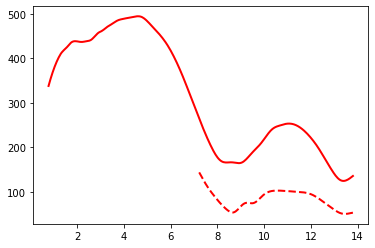

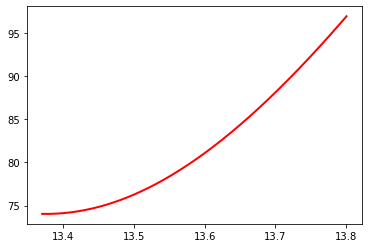

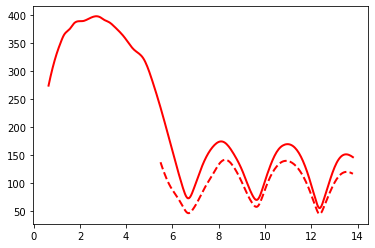

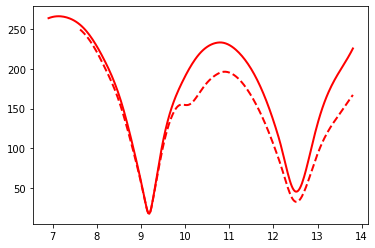

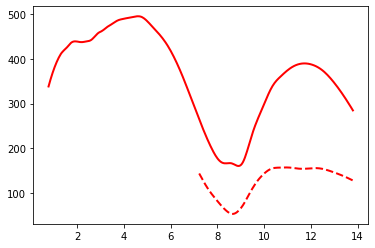

...

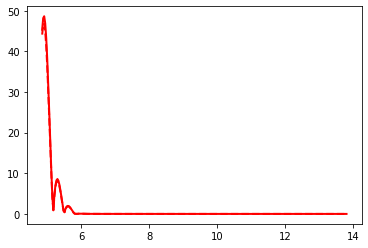

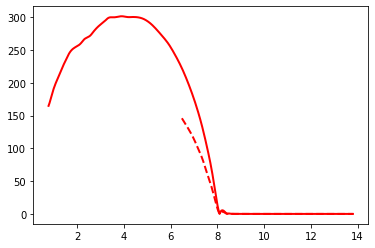

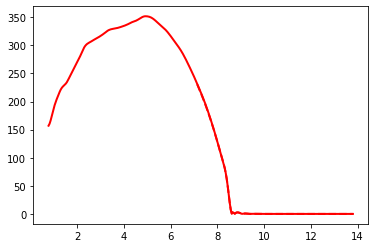

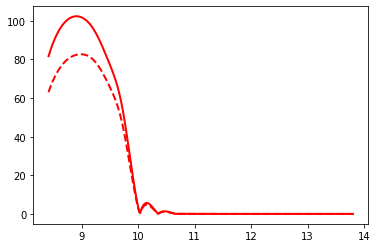

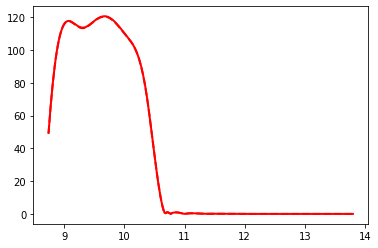

In [27]:
for idx in ids:
    fig, ax = plt.subplots(1, 1, sharex='none', sharey='none')
    k, (t, x, y, z, Rvir) = orbit_interpolation(ID=idx, resolution=100)
    t=np.array(t)
    x=np.array(x)
    y=np.array(y)
    z=np.array(z)
    R = (x**2 + y**2 + z**2)**(1/2)

    z_offset, t_Gyr = velocity_angles(ID=idx, interpolate=True, resolution=100)
    ax.plot(t, R, lw=2, alpha=1, c='r')
    ax.plot(t_Gyr[(t_Gyr>=t_infall[ids==idx]-1)], z_offset[(t_Gyr>=t_infall[ids==idx]-1)], lw=2, alpha=1, c='r', ls='--')
    plt.show()

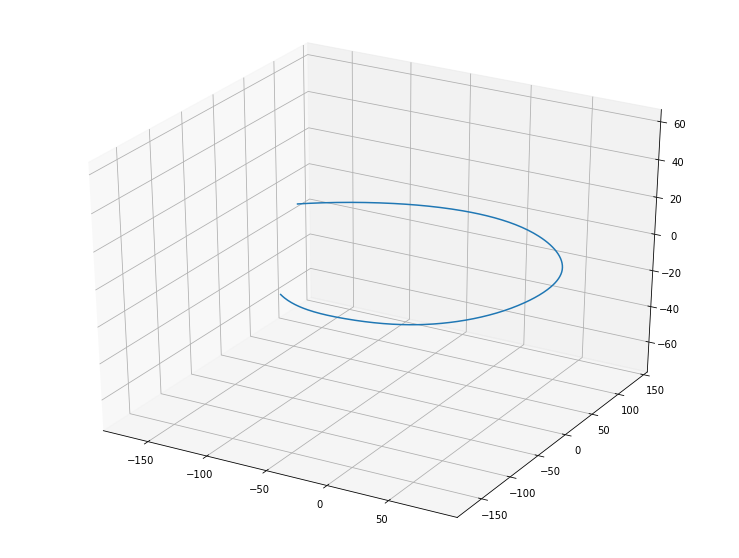

In [13]:
plt.figure(figsize=(13,10), facecolor='w')
ax = plt.axes(projection='3d')
ax.plot3D(x, y, z)

In [5]:
infall_zThetaL = np.array([velocity_angles(ID=idx, resolution=100)[6] for idx in ids])
infall_vTheta = np.array([velocity_angles(ID=idx, resolution=100)[2] for idx in ids])
infall_vPhi = np.array([velocity_angles(ID=idx, resolution=100)[3] for idx in ids])
infall_vRadial = np.array([velocity_angles(ID=idx, resolution=100)[4] for idx in ids])
infall_vTotal = np.array([velocity_angles(ID=idx, resolution=100)[5] for idx in ids])
infall_Theta = np.array([(velocity_angles(ID=idx, resolution=100)[0]) for idx in ids])
t_infall = data['time_infall']
M_infall = data['infall_mass']
infall_Theta = infall_Theta*180/np.pi
infall_Theta[infall_Theta>90]=180-infall_Theta[infall_Theta>90]

NameError: name 'velocity_angles' is not defined

Text(0, 0.5, '$v_\\Theta / |v|$ at Infall [km/s]')

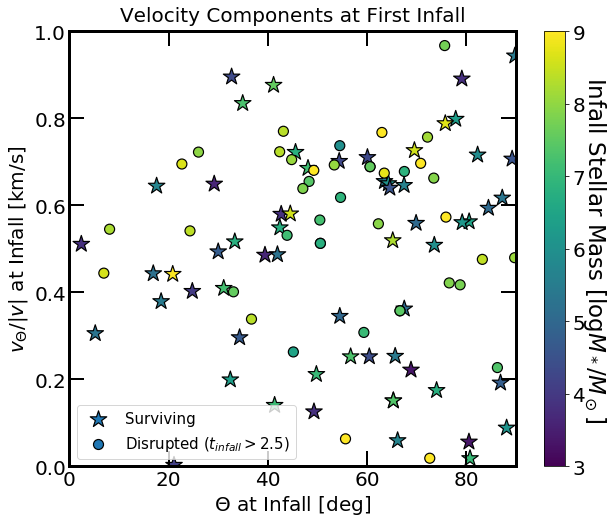

In [64]:
fig, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(10, 8))
fig.set_facecolor('w')
# fig.set_dpi(150.0)
np.seterr(divide='ignore')

linx=np.linspace(0, 14, 100)
cm = plt.cm.get_cmap('viridis')
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
x=infall_Theta
y=infall_vTheta/infall_vTotal
z=np.log10(M_infall)
k=t_infall
# Survivors
im1 = ax1.scatter(x[(status=='Survivor')&(k>2.5)], y[(status=='Survivor')&(k>2.5)], 
                  marker='*', edgecolor='k', c=z[(status=='Survivor')&(k>2.5)], alpha=1, lw=1.2, 
                  s=300, cmap=cm, vmin=3, vmax=9, label='Surviving') 
ax1.scatter(x[(status=='Zombie')&(k>2.5)], y[(status=='Zombie')&(k>2.5)], 
            marker='.', edgecolor='black', c=z[(status=='Zombie')&(k>2.5)], alpha=1, lw=1.2, 
            s=400, cmap=cm, vmin=3, vmax=9, label='Disrupted ($t_{infall} > 2.5$)') 
# ax1.plot(linx, linx, lw=0.7, c='black', ls='--')

cbar1 = fig.colorbar(im1, ax=ax1)
cbar1.set_label('Infall Stellar Mass [$\log M_* / M_\odot$]', rotation=270, fontsize=23, labelpad=23)
cbar1.ax.tick_params(labelsize=20)

ax1.set_xlim(0, 90)
ax1.set_ylim(0, 1)
ax1.legend(loc='best', fontsize=15, frameon=True)
ax1.tick_params(which='major', length=15, width=2, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('Velocity Components at First Infall', fontsize=20, pad=10)
ax1.set_xlabel('$\Theta$ at Infall [deg]', fontsize=20)
ax1.set_ylabel('$v_\Theta / |v|$ at Infall [km/s]', fontsize=20)

Text(0, 0.5, '$v_\\Theta / |v|$ [km/s]')

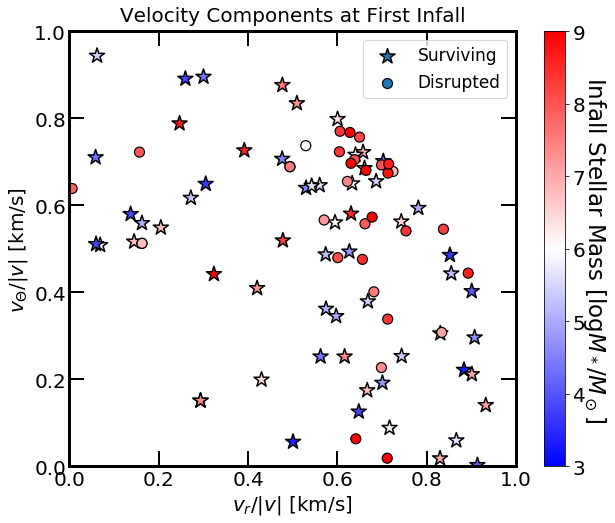

In [99]:
M_infall = data['infall_mass']
fig, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(10, 8))
fig.set_facecolor('w')
# fig.set_dpi(150.0)
np.seterr(divide='ignore')

linx=np.linspace(0, 14, 100)
cm = plt.cm.get_cmap('bwr')
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
x=infall_vRadial/infall_vTotal
y=infall_vTheta/infall_vTotal
z=np.log10(M_infall)
k=t_infall
# Survivors
im1 = ax1.scatter(x[(status=='Survivor')&(k>3)], y[(status=='Survivor')&(k>3)], 
                  marker='*', edgecolor='k', c=z[(status=='Survivor')&(k>3)], alpha=1, lw=1.5, 
                  s=250, cmap=cm, vmin=3, vmax=9, label='Surviving') 
ax1.scatter(x[(status=='Zombie')&(k>3)], y[(status=='Zombie')&(k>3)], 
            marker='.', edgecolor='black', c=z[(status=='Zombie')&(k>3)], alpha=1, lw=1.2, 
            s=400, cmap=cm, vmin=3, vmax=9, label='Disrupted') 
# ax1.plot(linx, linx, lw=0.7, c='black', ls='--')

cbar1 = fig.colorbar(im1, ax=ax1)
cbar1.set_label('Infall Stellar Mass [$\log M_* / M_\odot$]', rotation=270, fontsize=23, labelpad=23)
cbar1.ax.tick_params(labelsize=20)

ax1.set_xlim(0, 1)
ax1.set_ylim(0, 1)
ax1.legend(loc='upper right', fontsize=17, frameon=True)
ax1.tick_params(which='major', length=15, width=2, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('Velocity Components at First Infall', fontsize=20, pad=10)
ax1.set_xlabel('$v_r / |v|$ [km/s]', fontsize=20)
ax1.set_ylabel('$v_\Theta / |v|$ [km/s]', fontsize=20)



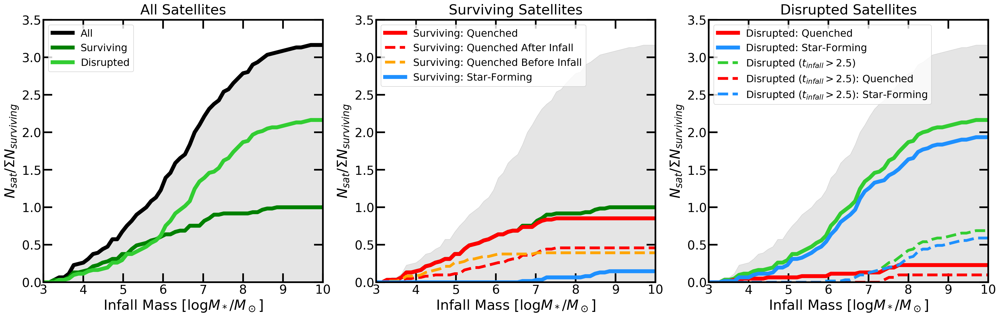

In [6]:
status = data['Status'].to_numpy()
simulation = data['Simulation'].to_numpy()
M_infall = np.log10(data['infall_mass'].to_numpy())
t_quench = data['time_quench'].to_numpy()
t_infall = data['time_infall'].to_numpy()

norm = len(status[status=='Survivor'])

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex='none', sharey='none', figsize=(25, 8))
fig.set_facecolor('w')
np.seterr(divide='ignore')
fig.set_dpi(150)
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
plt.setp(ax2.spines.values(), linewidth=3)
plt.setp(ax3.spines.values(), linewidth=3)
linx=np.linspace(0, 12, 100)
# Survivors


A, B = np.histogram(M_infall, linx)
ax1.fill_between(B[:-1], np.cumsum(A)/norm, color='black', alpha=0.1)
ax1.plot(B[:-1], np.cumsum(A)/norm, color='black', lw=7, label='All')
A, B = np.histogram(M_infall[status=='Survivor'], linx)
ax1.plot(B[:-1], np.cumsum(A)/norm, color='green',  lw=7, label='Surviving')
A, B = np.histogram(M_infall[status=='Zombie'], linx)
ax1.plot(B[:-1], np.cumsum(A)/norm, color='limegreen',  lw=7, label='Disrupted')
ax1.set_xlim(3, 10)
ax1.set_ylim(0, 3.5)
ax1.legend(loc='upper left', fontsize=18, frameon=True)
ax1.tick_params(which='major', length=16, width=3, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=22, bottom=True, top=True, left=True, right=True)
ax1.set_title('All Satellites', fontsize=25, pad=10)
ax1.set_xlabel('Infall Mass [$\log M_*/M_\odot$]', fontsize=25)
ax1.set_ylabel('$N_{sat}/\Sigma N_{surviving}$', fontsize=25)


A, B = np.histogram(M_infall, linx)
ax2.fill_between(B[:-1], np.cumsum(A)/norm, color='black', alpha=0.1)
A, B = np.histogram(M_infall[status=='Survivor'], linx)
ax2.plot(B[:-1], np.cumsum(A)/norm, color='green',  lw=7)
A, B = np.histogram(M_infall[(status=='Survivor') & (t_quench>0)], linx)
ax2.plot(B[:-1], np.cumsum(A)/norm, color='red',  lw=7, label='Surviving: Quenched')

A, B = np.histogram(M_infall[(status=='Survivor') & (t_quench>=t_infall)], linx)
ax2.plot(B[:-1], np.cumsum(A)/norm, color='red',  ls='--', lw=5, label='Surviving: Quenched After Infall')
A, B = np.histogram(M_infall[(status=='Survivor') & (t_quench>0) & (t_quench<t_infall)], linx)
ax2.plot(B[:-1], np.cumsum(A)/norm, color='orange',  ls='--', lw=5, label='Surviving: Quenched Before Infall')

A, B = np.histogram(M_infall[(status=='Survivor') & (t_quench<=0)], linx)
ax2.plot(B[:-1], np.cumsum(A)/norm, color='dodgerblue',  lw=7, label='Surviving: Star-Forming')
ax2.set_xlim(3, 10)
ax2.set_ylim(0, 3.5)
ax2.legend(loc='upper left', fontsize=18, frameon=True)
ax2.tick_params(which='major', length=16, width=3, labelsize=15)
ax2.tick_params(which='minor', length=8, width=2, labelsize=15)
ax2.tick_params(direction='in', which='both', labelsize=22, bottom=True, top=True, left=True, right=True)
ax2.set_title('Surviving Satellites', fontsize=25, pad=10)
ax2.set_xlabel('Infall Mass [$\log M_*/M_\odot$]', fontsize=25)
ax2.set_ylabel('$N_{sat}/\Sigma N_{surviving}$', fontsize=25)

A, B = np.histogram(M_infall, linx)
ax3.fill_between(B[:-1], np.cumsum(A)/norm, color='black', alpha=0.1)
A, B = np.histogram(M_infall[status=='Zombie'], linx)
ax3.plot(B[:-1], np.cumsum(A)/norm, color='limegreen',  lw=7)
A, B = np.histogram(M_infall[(status=='Zombie') & (t_quench>0)], linx)
ax3.plot(B[:-1], np.cumsum(A)/norm, color='red',  lw=7, label='Disrupted: Quenched')
A, B = np.histogram(M_infall[(status=='Zombie') & (t_quench<=0)], linx)
ax3.plot(B[:-1], np.cumsum(A)/norm, color='dodgerblue',  lw=7, label='Disrupted: Star-Forming')
A, B = np.histogram(M_infall[(status=='Zombie') & (t_infall>=2.5)], linx)
ax3.plot(B[:-1], np.cumsum(A)/norm, color='limegreen',  lw=5, ls='--', label='Disrupted ($t_{infall} > 2.5$)')
A, B = np.histogram(M_infall[(status=='Zombie') & (t_quench>0) & (t_infall>=2.5)], linx)
ax3.plot(B[:-1], np.cumsum(A)/norm, color='red',  lw=5, ls='--', label='Disrupted ($t_{infall} > 2.5$): Quenched')
A, B = np.histogram(M_infall[(status=='Zombie') & (t_quench<=0) & (t_infall>=2.5)], linx)
ax3.plot(B[:-1], np.cumsum(A)/norm, color='dodgerblue',  lw=5, ls='--', label='Disrupted ($t_{infall} > 2.5$): Star-Forming')

ax3.set_xlim(3, 10)
ax3.set_ylim(0, 3.5)
ax3.legend(loc='upper left', fontsize=18, frameon=True)
ax3.tick_params(which='major', length=16, width=3, labelsize=15)
ax3.tick_params(which='minor', length=8, width=2, labelsize=15)
ax3.tick_params(direction='in', which='both', labelsize=22, bottom=True, top=True, left=True, right=True)
ax3.set_title('Disrupted Satellites', fontsize=25, pad=10)
ax3.set_xlabel('Infall Mass [$\log M_*/M_\odot$]', fontsize=25)
ax3.set_ylabel('$N_{sat}/\Sigma N_{surviving}$', fontsize=25)

fig.tight_layout()

Text(0, 0.5, 'b [kpc]')

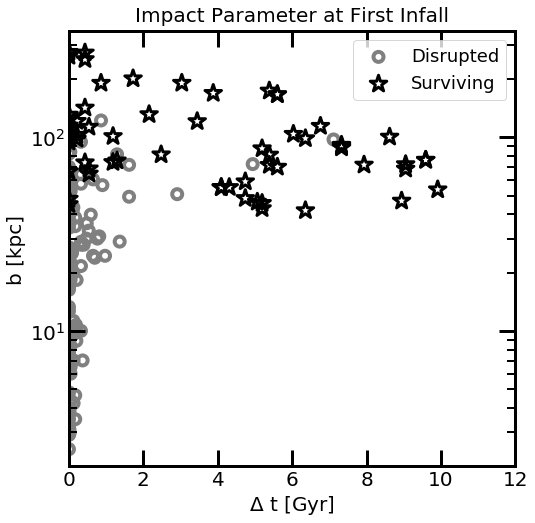

In [16]:
t_infall = data['time_infall'].to_numpy()
# print(t_infall)
status = data['Status'].to_numpy()
# print(status)
d_impact = data['impact_parameter_kpc'].to_numpy()
# print(d_impact)
t_final = data['time_disruption'].to_numpy()
t_final[t_final==-1]=13.80 # For survivors
# print(t_final)
Delta_t = t_final - t_infall
# print(Delta_t)

fig, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(8, 8))
fig.set_facecolor('w')
# fig.set_dpi(150)
np.seterr(divide='ignore')
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)

# Survivors
ax1.scatter(Delta_t[status=='Zombie'], d_impact[status=='Zombie'], marker='.', edgecolor='grey', facecolor='none', lw=4, s=400, label='Disrupted') 
ax1.scatter(Delta_t[status=='Survivor'], d_impact[status=='Survivor'], marker='*', edgecolor='k', facecolor='none', lw=3, s=300, label='Surviving') 
ax1.set_yscale('log')
ax1.set_xlim(0, 12)
ax1.set_ylim(2,)
ax1.legend(loc='upper right', fontsize=18, frameon=True)
ax1.tick_params(which='major', length=16, width=3, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('Impact Parameter at First Infall', fontsize=20, pad=10)
ax1.set_xlabel('$\Delta$ t [Gyr]', fontsize=20)
ax1.set_ylabel('b [kpc]', fontsize=20)
# N100 and N1000 plots side by side

Text(0, 0.5, 'b [kpc]')

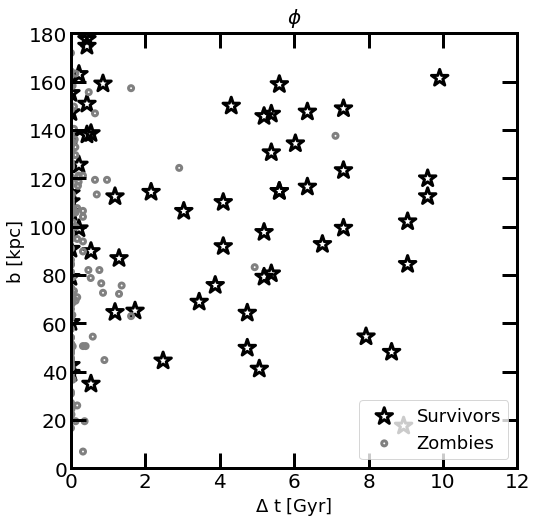

In [6]:
t_infall = data['time_infall'].to_numpy()
# print(t_infall)
status = data['Status'].to_numpy()
# print(status)
phi_infall = data['infall_phi_z'].to_numpy()
phi_infall_deg = 180*phi_infall/np.pi
t_final = data['time_disruption'].to_numpy()
t_final[t_final==-1]=13.80 # For survivors
# print(t_final)
Delta_t = t_final - t_infall
# print(Delta_t)

fig, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(8, 8))
fig.set_facecolor('w')
np.seterr(divide='ignore')
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)

# Survivors
ax1.scatter(Delta_t[status=='Survivor'], phi_infall_deg[status=='Survivor'], marker='*', edgecolor='k', facecolor='none', lw=3, s=300, label='Survivors') 
ax1.scatter(Delta_t[status=='Zombie'], phi_infall_deg[status=='Zombie'], marker='.', edgecolor='grey', facecolor='none', lw=3, s=100, label='Zombies') 
# ax1.set_yscale('log')
ax1.set_xlim(0, 12)
ax1.set_ylim(0, 180)
ax1.legend(loc='lower right', fontsize=18, frameon=True)
ax1.tick_params(which='major', length=15, width=3, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('$\phi$', fontsize=20, pad=10)
ax1.set_xlabel('$\Delta$ t [Gyr]', fontsize=18)
ax1.set_ylabel('b [kpc]', fontsize=18)

In [1]:
from mpl_toolkits import mplot3d
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

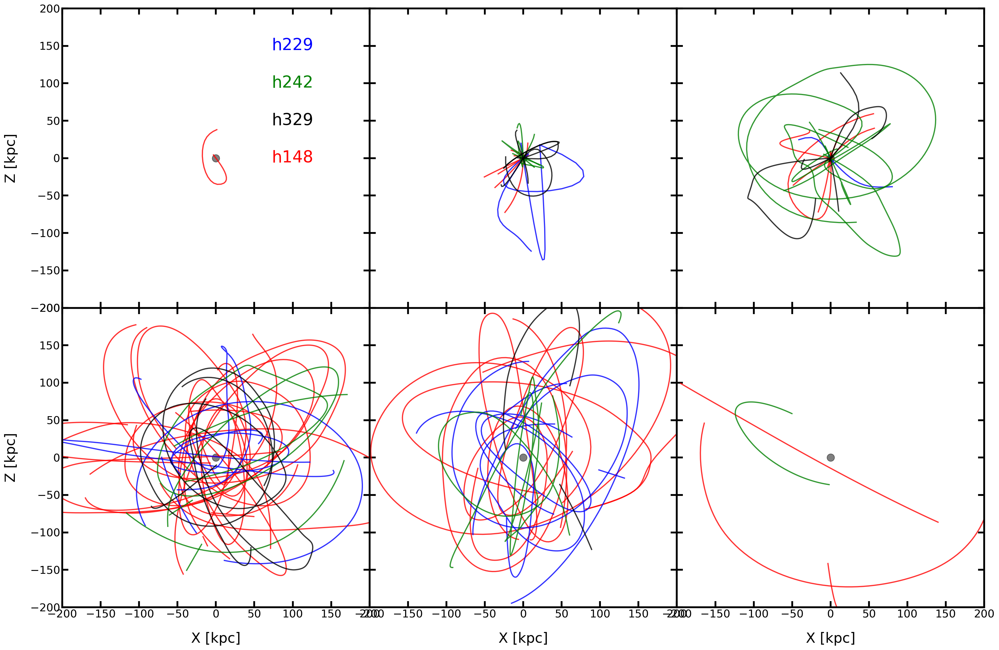

In [22]:
# %matplotlib notebook
infall_Mstar = data['infall_mass'].to_numpy()
plt.rcParams.update({'figure.max_open_warning': 0})
t_infall = data['time_infall'].to_numpy()
status = data['Status'].to_numpy()
sim = data['Simulation'].to_numpy()
# plt.figure(figsize=, facecolor='w')
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, sharex='all', sharey='all', figsize=(23, 15))
# fig = plt.figure(figsize=(30, 18))
fig.set_dpi(150)
fig.set_facecolor('w')
plt.setp(ax1.spines.values(), linewidth=3)
plt.setp(ax2.spines.values(), linewidth=3)
plt.setp(ax3.spines.values(), linewidth=3)

plt.setp(ax4.spines.values(), linewidth=3)
plt.setp(ax5.spines.values(), linewidth=3)
plt.setp(ax6.spines.values(), linewidth=3)
# ax1 = fig.add_subplot(231, projection='2d')
# ax2 = fig.add_subplot(232, projection='2d')
# ax3 = fig.add_subplot(233, projection='2d')
# ax4 = fig.add_subplot(234, projection='2d')
# ax5 = fig.add_subplot(235, projection='2d')
# ax6 = fig.add_subplot(236, projection='2d')
# ax = plt.axes(projection='2d')

# colors = ['red', 'blue', 'black', 'orange', 'green', 'dodgerblue']
for idx in ids[(status=='Zombie') & (t_infall>=2.5)]:
    t_in=t_infall[ids==idx]
    s=sim[ids==idx]
    raw, (t, x, y, z, Rvir) = orbit_interpolation(ID=idx, resolution=100)
    # Data for a three-dimensional line
    if np.log10(infall_Mstar[ids==idx])<6:
        if s=='h148':
            ax1.plot(x[t>=t_in], z[t>=t_in], c='red', alpha=0.8, lw=2)
        elif s=='h229':
            ax1.plot(x[t>=t_in], z[t>=t_in], c='blue', alpha=0.8, lw=2)
        elif s=='h242':
            ax1.plot(x[t>=t_in], z[t>=t_in], c='green', alpha=0.8, lw=2)
        elif s=='h329':
            ax1.plot(x[t>=t_in], z[t>=t_in], c='black', alpha=0.8, lw=2)
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        if s=='h148':
            ax2.plot(x[t>=t_in], z[t>=t_in], c='red', alpha=0.8, lw=2)
        elif s=='h229':
            ax2.plot(x[t>=t_in], z[t>=t_in], c='blue', alpha=0.8, lw=2)
        elif s=='h242':
            ax2.plot(x[t>=t_in], z[t>=t_in], c='green', alpha=0.8, lw=2)
        elif s=='h329':
            ax2.plot(x[t>=t_in], z[t>=t_in], c='black', alpha=0.8, lw=2)
    elif np.log10(infall_Mstar[ids==idx])>=8:
        if s=='h148':
            ax3.plot(x[t>=t_in], z[t>=t_in], c='red', alpha=0.8, lw=2)
        elif s=='h229':
            ax3.plot(x[t>=t_in], z[t>=t_in], c='blue', alpha=0.8, lw=2)
        elif s=='h242':
            ax3.plot(x[t>=t_in], z[t>=t_in], c='green', alpha=0.8, lw=2)
        elif s=='h329':
            ax3.plot(x[t>=t_in], z[t>=t_in], c='black', alpha=0.8, lw=2)
        
for idx in ids[(status=='Survivor')]:
    t_in=t_infall[ids==idx]
    s=sim[ids==idx]
    raw, (t, x, y, z, Rvir) = orbit_interpolation(ID=idx, resolution=100)
    # Data for a three-dimensional line
    if np.log10(infall_Mstar[ids==idx])<6:
        if s=='h148':
            ax4.plot(np.array(x)[t>=t_in], np.array(z)[t>=t_in], c='red', alpha=0.8, lw=2)
        elif s=='h229':
            ax4.plot(np.array(x)[t>=t_in], np.array(z)[t>=t_in], c='blue', alpha=0.8, lw=2)
        elif s=='h242':
            ax4.plot(np.array(x)[t>=t_in], np.array(z)[t>=t_in], c='green', alpha=0.8, lw=2)
        elif s=='h329':
            ax4.plot(np.array(x)[t>=t_in], np.array(z)[t>=t_in], c='black', alpha=0.8, lw=2)
    elif np.log10(infall_Mstar[ids==idx])>=6 and np.log10(infall_Mstar[ids==idx])<8:
        if s=='h148':
            ax5.plot(np.array(x)[t>=t_in], np.array(z)[t>=t_in], c='red', alpha=0.8, lw=2)
        elif s=='h229':
            ax5.plot(np.array(x)[t>=t_in], np.array(z)[t>=t_in], c='blue', alpha=0.8, lw=2)
        elif s=='h242':
            ax5.plot(np.array(x)[t>=t_in], np.array(z)[t>=t_in], c='green', alpha=0.8, lw=2)
        elif s=='h329':
            ax5.plot(np.array(x)[t>=t_in], np.array(z)[t>=t_in], c='black', alpha=0.8, lw=2)
    elif np.log10(infall_Mstar[ids==idx])>=8:
        if s=='h148':
            ax6.plot(np.array(x)[t>=t_in], np.array(z)[t>=t_in], c='red', alpha=0.8, lw=2)
        elif s=='h229':
            ax6.plot(np.array(x)[t>=t_in], np.array(z)[t>=t_in], c='blue', alpha=0.8, lw=2)
        elif s=='h242':
            ax6.plot(np.array(x)[t>=t_in], np.array(z)[t>=t_in], c='green', alpha=0.8, lw=2)
        elif s=='h329':
            ax6.plot(np.array(x)[t>=t_in], np.array(z)[t>=t_in], c='black', alpha=0.8, lw=2)

ax1.text(100, 0, 'h148', horizontalalignment='center', verticalalignment='center',
         fontsize=27, color='red')
ax1.text(100, 150, 'h229', horizontalalignment='center', verticalalignment='center',
         fontsize=27, color='blue')
ax1.text(100, 100, 'h242', horizontalalignment='center', verticalalignment='center',
         fontsize=27, color='green')
ax1.text(100, 50, 'h329', horizontalalignment='center', verticalalignment='center',
         fontsize=27, color='black')
ax1.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
# ax1.set_title('Disrupted ($t_{infall} > 2.5$) \n[$\log M_*/M_\odot < 6$]', fontsize=25, pad=10)
# ax1.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# ax1.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# ax1.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax1.scatter(0, 0, c='k', marker='.', s=600, alpha=0.5)
ax1.set_xlim(-200, 200)
ax1.set_ylim(-200, 200)
# ax1.set_zlim(-200, 200)
ax1.tick_params(which='both', length=10, labelsize=18)
# ax1.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax1.set_ylabel('Z [kpc]', fontsize=23, labelpad=20)
# ax1.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax1.set_xticks([])
# ax1.azim=20
# ax1.elev=20

ax2.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
# ax2.set_title('Disrupted ($t_{infall} > 2.5$) \n[$6 \leq \log M_*/M_\odot < 8$]', fontsize=25, pad=10)
# ax2.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# ax2.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# ax2.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax2.scatter(0, 0, c='k', marker='.', s=600, alpha=0.5)
ax2.set_xlim(-200, 200)
ax2.set_ylim(-200, 200)
# ax2.set_zlim(-200, 200)
ax2.tick_params(which='both', length=10, labelsize=18)
# ax2.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
# ax2.set_ylabel('Z [kpc]', fontsize=23, labelpad=20)
# ax2.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax2.set_xticks([])
# ax2.azim=20
# ax2.elev=20

ax3.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
# ax3.set_title('Disrupted ($t_{infall} > 2.5$) \n[$8 \leq \log M_*/M_\odot$]', fontsize=25, pad=10)
# ax3.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# ax3.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# ax3.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax3.scatter(0, 0, c='k', marker='.', s=600, alpha=0.5)
ax3.set_xlim(-200, 200)
ax3.set_ylim(-200, 200)
# ax3.set_zlim(-200, 200)
ax3.tick_params(which='both', length=10, labelsize=18)
# ax3.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
# ax3.set_ylabel('Z [kpc]', fontsize=23, labelpad=20)
# ax3.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax3.set_xticks([])
# ax3.azim=20
# ax3.elev=20

ax4.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
# ax4.set_title('Surviving \n[$\log M_*/M_\odot < 6$]', fontsize=25, pad=10)
# ax4.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# ax4.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# ax4.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax4.scatter(0, 0, c='k', marker='.', s=600, alpha=0.5)
ax4.set_xlim(-200, 200)
ax4.set_ylim(-200, 200)
# ax4.set_zlim(-200, 200)
ax4.tick_params(which='both', length=10, labelsize=18)
ax4.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
ax4.set_ylabel('Z [kpc]', fontsize=23, labelpad=20)
# ax4.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax4.set_xticks([])
# ax4.azim=20
# ax4.elev=20

ax5.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
# ax5.set_title('Surviving \n[$6 \leq \log M_*/M_\odot < 8$]', fontsize=25, pad=10)
# ax5.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# ax5.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# ax5.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax5.scatter(0, 0, c='k', marker='.', s=600, alpha=0.5)
ax5.set_xlim(-200, 200)
ax5.set_ylim(-200, 200)
# ax5.set_zlim(-200, 200)
ax5.tick_params(which='both', length=10, labelsize=18)
ax5.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
# ax5.set_ylabel('Z [kpc]', fontsize=23, labelpad=20)
# ax5.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax5.set_xticks([])
# ax5.azim=20
# ax5.elev=20

ax6.tick_params(direction='in', which='both', width=3, labelsize=20, bottom=True, top=True, left=True, right=True)
# ax6.set_title('Surviving \n[$8 \leq \log M_*/M_\odot$]', fontsize=25, pad=10)
# ax6.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# ax6.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# ax6.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax6.scatter(0, 0, c='k', marker='.', s=600, alpha=0.5)
ax6.set_xlim(-200, 200)
ax6.set_ylim(-200, 200)
# ax6.set_zlim(-200, 200)
ax6.tick_params(which='both', length=10, labelsize=18)
ax6.set_xlabel('X [kpc]', fontsize=23, labelpad=20)
# ax6.set_ylabel('Z [kpc]', fontsize=23, labelpad=20)
# ax6.set_zlabel('Z [kpc]', fontsize=23, labelpad=20)
# ax6.set_xticks([])
# ax6.azim=20
# ax6.elev=20

fig.tight_layout()
fig.subplots_adjust(wspace=0, hspace=0)
# fig.tight_layout()

Text(0.5, 0, 'z (kpc)')

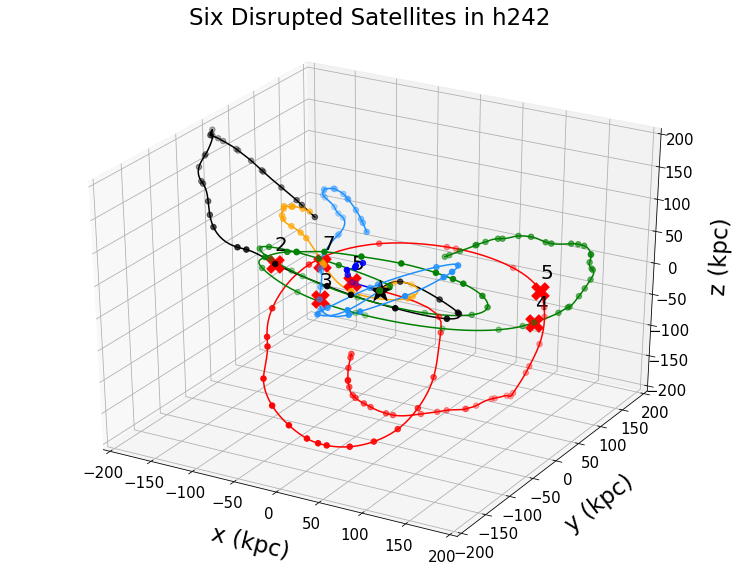

In [53]:
plt.rcParams.update({'figure.max_open_warning': 0})

plt.figure(figsize=(13,10), facecolor='w')
ax = plt.axes(projection='3d')
ax.scatter3D(0, 0, 0, c='k', marker='*', s=500)
colors = ['red', 'blue', 'black', 'orange', 'green', 'dodgerblue', 'gray']
for i, sat in enumerate(h242_zombies[0:2] + h242_zombies[10:12] + h242_zombies[14:15] + h242_zombies[26:27]):
    
    raw, spline = orbit_interpolation(simulation='h242', status='Zombie', 
                                      tangos_halo=sat, 
                                      halo_id=0, snap_num=0)
    #cut = (abs(spline[1])<=250) & (abs(spline[2])<=250) & (abs(spline[3])<=250)
    # Data for a three-dimensional line
    ax.plot3D(spline[1], spline[2], spline[3], c=colors[i])
    # Data for three-dimensional scattered points
    im = ax.scatter3D(raw[1], raw[2], raw[3], c=colors[i], s=30)#, cmap='viridis', vmin=0, vmax=13.9)
    t_infall = accretion_time(simulation='h242', status='Zombie', 
                              tangos_halo=sat)[1]
    ax.scatter3D(raw[1][raw[0]==t_infall], 
                 raw[2][raw[0]==t_infall], 
                 raw[3][raw[0]==t_infall], marker='X', s=300, c='r', zorder=0, alpha=1)
    ax.text(raw[1][raw[0]==t_infall][0], 
            raw[2][raw[0]==t_infall][0], 
            raw[3][raw[0]==t_infall][0]+20, str(get_halo_snap_num(tangos_halo=sat, simulation='h242')[0]), fontsize=20)
#     ax.text(0, 0, 0+20, 
#             str(get_halo_snap_num(tangos_halo=sat, simulation='h242')[0]), fontsize=20)
# cbar1 = plt.colorbar(im, ax=ax)
# cbar1.set_label('Cosmic Time (Gyr)', rotation=270, fontsize=23, labelpad=25)
# cbar1.ax.tick_params(labelsize=20)
ax.set_xlim(-200, 200)
ax.set_ylim(-200, 200)
ax.set_zlim(-200, 200)
ax.tick_params(which='both', length=10, labelsize=15)
ax.set_title('Six Disrupted Satellites in h242', fontsize=23, pad=45)
#ax.set_title(str(get_halo_snap_num(tangos_halo=sat, simulation='h242')[2]), fontsize=23)
ax.set_xlabel('x (kpc)', fontsize=23, labelpad=20)
ax.set_ylabel('y (kpc)', fontsize=23, labelpad=20)
ax.set_zlabel('z (kpc)', fontsize=23, labelpad=20)

Text(0, 0.5, '$M_{\\star_{Sat}}$ / $M_{\\star_{Host}}$ at Infall')

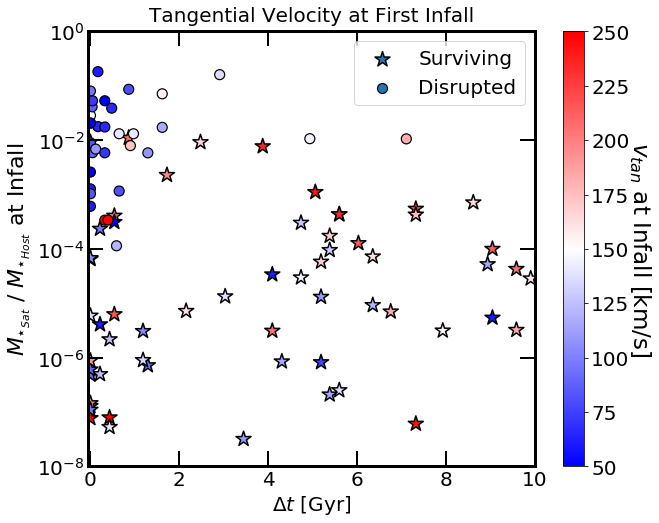

In [23]:
vtan = data['infall_tangential_velocity']
vtot = data['infall_relative_velocity']
M_infall = data['infall_mass'].to_numpy()
t_infall = data['time_infall'].to_numpy()
t_final = data['time_disruption'].to_numpy()
status = data['Status'].to_numpy()
t_final[t_final==-1]=13.80 # For survivors
# print(t_final)
Delta_t = t_final - t_infall

fig, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(10, 8))
fig.set_facecolor('w')
# fig.set_dpi(150.0)
np.seterr(divide='ignore')

linx=np.linspace(0, 14, 100)
cm = plt.cm.get_cmap('bwr')
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
x=Delta_t
y=data['infall_mass_ratio'].to_numpy() #np.log10(M_infall)
z=vtan
k=t_infall
# Survivors
im1 = ax1.scatter(x[(status=='Survivor') & (k>3)], y[(status=='Survivor') & (k>3)], 
                  marker='*', edgecolor='k', c=z[(status=='Survivor') & (k>3)], alpha=1, lw=1.5, 
                  s=250, cmap=cm, vmin=50, vmax=250, label='Surviving') 
ax1.scatter(x[(status=='Zombie') & (k>3)], y[(status=='Zombie') & (k>3)], 
            marker='.', edgecolor='black', c=z[(status=='Zombie') & (k>3)], alpha=1, lw=1.2, 
            s=400, cmap=cm, vmin=50, vmax=250, label='Disrupted') 
# ax1.plot(linx, linx, lw=0.7, c='black', ls='--')

cbar1 = fig.colorbar(im1, ax=ax1)
cbar1.set_label('$v_{tan}$ at Infall [km/s]', rotation=270, fontsize=23, labelpad=23)
cbar1.ax.tick_params(labelsize=20)

ax1.set_xlim(-0.05, 10)
ax1.set_ylim(1e-8 , 1e0)
ax1.set_yscale('log')
ax1.legend(loc='upper right', fontsize=20, frameon=True)
ax1.tick_params(which='major', length=15, width=2, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('Tangential Velocity at First Infall', fontsize=20, pad=10)
ax1.set_xlabel('$\Delta t$ [Gyr]', fontsize=20)
ax1.set_ylabel('$M_{\star_{Sat}}$ / $M_{\star_{Host}}$ at Infall', fontsize=22)

# Keep this!!

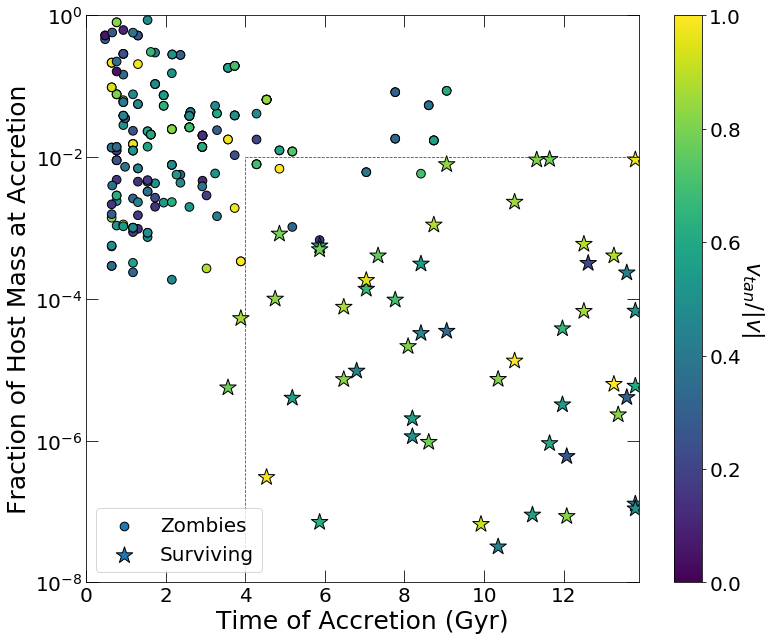

In [8]:
# only look at zombies that existed for more than 2 snapshots
#concatenate for all 4 sims
fig, ax4 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(11, 9))
fig.set_facecolor('w')
np.seterr(divide='ignore')

linx=np.linspace(1e-10, 14, 100)
cm = plt.cm.get_cmap('viridis')

x = np.zeros(0)
y = np.zeros(0)
z = np.zeros(0)
r = np.zeros(0)
#Zombies
for sat in h148_zombies:
    x = np.concatenate((x, accretion_time(simulation='h148', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    y = np.concatenate((y, accretion_time(simulation='h148', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
    z = np.concatenate((z, infall_velocity(simulation='h148', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h148', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
#Zombies
for sat in h229_zombies:
    x = np.concatenate((x, accretion_time(simulation='h229', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    y = np.concatenate((y, accretion_time(simulation='h229', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
    z = np.concatenate((z, infall_velocity(simulation='h229', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h229', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
#Zombies
for sat in h242_zombies:
    x = np.concatenate((x, accretion_time(simulation='h242', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    y = np.concatenate((y, accretion_time(simulation='h242', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
    z = np.concatenate((z, infall_velocity(simulation='h242', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h242', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
#Zombies
for sat in h329_zombies:
    x = np.concatenate((x, accretion_time(simulation='h329', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    y = np.concatenate((y, accretion_time(simulation='h329', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
    z = np.concatenate((z, infall_velocity(simulation='h329', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h329', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
i1 = ax4.scatter(x[x!=-1], y[x!=-1], s=300, c=r/z, alpha=1, label='Zombies', marker='.', edgecolor='k', vmin=0, vmax=1, cmap=cm)


x = np.zeros(0)
y = np.zeros(0)
z = np.zeros(0)
r = np.zeros(0)
#Survivors
for sat in h148_survivors:
    x = np.concatenate((x, accretion_time(simulation='h148', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    y = np.concatenate((y, accretion_time(simulation='h148', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
    z = np.concatenate((z, infall_velocity(simulation='h148', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h148', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
#Survivors
for sat in h229_survivors:
    x = np.concatenate((x, accretion_time(simulation='h229', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    y = np.concatenate((y, accretion_time(simulation='h229', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
    z = np.concatenate((z, infall_velocity(simulation='h229', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h229', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
#Survivors
for sat in h242_survivors:
    x = np.concatenate((x, accretion_time(simulation='h242', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    y = np.concatenate((y, accretion_time(simulation='h242', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
    z = np.concatenate((z, infall_velocity(simulation='h242', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h242', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
#Survivors
for sat in h329_survivors:
    x = np.concatenate((x, accretion_time(simulation='h329', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    y = np.concatenate((y, accretion_time(simulation='h329', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
    z = np.concatenate((z, infall_velocity(simulation='h329', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h329', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
i1 = ax4.scatter(x[x!=-1], y[x!=-1], s=300, c=r/z, alpha=1, label='Surviving', marker='*', edgecolor='k', vmin=0, vmax=1, cmap=cm)
# (d!=0) & (x>=2)
cbar1 = fig.colorbar(i1, ax=ax4)
cbar1.set_label('$v_{tan}/|v|$', rotation=270, fontsize=23, labelpad=25)
cbar1.ax.tick_params(labelsize=20)

ax4.legend(loc='lower left', fontsize=20, frameon=True)
ax4.plot(np.linspace(4, 14, 100), [1e-2]*100, ls='--', c='green', lw=0.8)
ax4.plot([4]*100, np.linspace(1e-10, 1e-2, 100),  ls='--', c='green', lw=0.8)
ax4.set_yscale('log')
#ax4.text(0.7, 0.9, 'h329', transform=ax4.transAxes, fontsize=23)
ax4.set_ylim(1e-8, 1e0)
ax4.set_xlim(0, 13.9)
ax4.set_ylabel('Fraction of Host Mass at Accretion', fontsize=25)
ax4.set_xlabel('Time of Accretion (Gyr)', fontsize=25)
ax4.tick_params(which='major', length=12)
ax4.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)


fig.tight_layout()


/home/pathakde/MAP2020/mergers/tangos_halo_module/halo_properties.py:502: RuntimeWarning: invalid value encountered in true_divide
  (satz - hostz)**2)**(1/2)


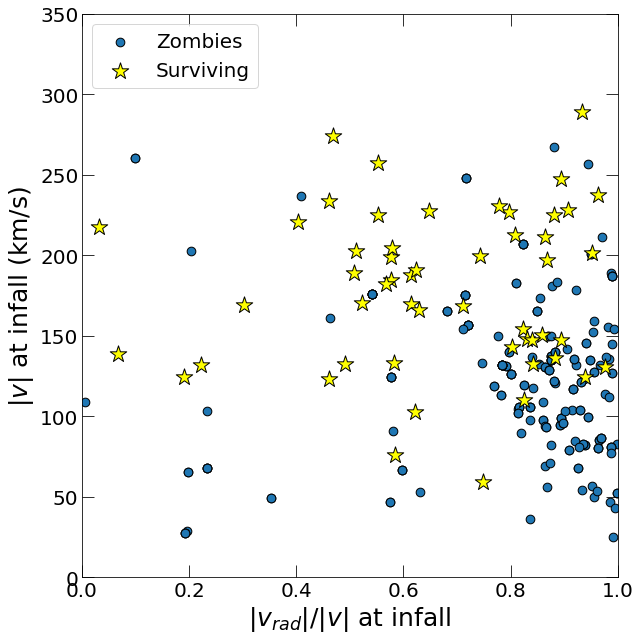

In [4]:
# x-->v_{rad}/|v|
# y-->v_{tan}/|v|
fig, ax4 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(9, 9))
fig.set_facecolor('w')
np.seterr(divide='ignore')

linx=np.linspace(1e-10, 14, 100)
cm = plt.cm.get_cmap('viridis')

v = np.zeros(0)
r = np.zeros(0)
t = np.zeros(0)
#Zombies
for sat in h148_zombies:
    v = np.concatenate((v, infall_velocity(simulation='h148', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h148', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    t = np.concatenate((t, infall_velocity(simulation='h148', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
#Zombies
for sat in h229_zombies:
    v = np.concatenate((v, infall_velocity(simulation='h229', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h229', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    t = np.concatenate((t, infall_velocity(simulation='h229', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
#Zombies
for sat in h242_zombies:
    v = np.concatenate((v, infall_velocity(simulation='h242', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h242', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    t = np.concatenate((t, infall_velocity(simulation='h242', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
#Zombies
for sat in h329_zombies:
    v = np.concatenate((v, infall_velocity(simulation='h329', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h329', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    t = np.concatenate((t, infall_velocity(simulation='h329', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
i1 = ax4.scatter(abs(r/v), v, s=300, alpha=1, label='Zombies', marker='.', edgecolor='k')
 
v = np.zeros(0)
r = np.zeros(0)
t = np.zeros(0)
#Survivors
for sat in h148_survivors:
    v = np.concatenate((v, infall_velocity(simulation='h148', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h148', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    t = np.concatenate((t, infall_velocity(simulation='h148', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
#Survivors
for sat in h229_survivors:
    v = np.concatenate((v, infall_velocity(simulation='h229', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h229', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    t = np.concatenate((t, infall_velocity(simulation='h229', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
#Survivors
for sat in h242_survivors:
    v = np.concatenate((v, infall_velocity(simulation='h242', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h242', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    t = np.concatenate((t, infall_velocity(simulation='h242', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
#Survivors
for sat in h329_survivors:
    v = np.concatenate((v, infall_velocity(simulation='h329', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h329', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    t = np.concatenate((t, infall_velocity(simulation='h329', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
i1 = ax4.scatter(abs(r/v), v, s=300, alpha=1, label='Surviving', marker='*', c='yellow', edgecolor='k')

ax4.legend(loc='upper left', fontsize=20, frameon=True)
ax4.set_ylim(0, 350)
ax4.set_xlim(0, 1)
ax4.set_ylabel('$|v|$ at infall (km/s)', fontsize=25)
ax4.set_xlabel('$|v_{rad}|/|v|$ at infall', fontsize=25)
ax4.tick_params(which='major', length=12)
ax4.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)


fig.tight_layout()

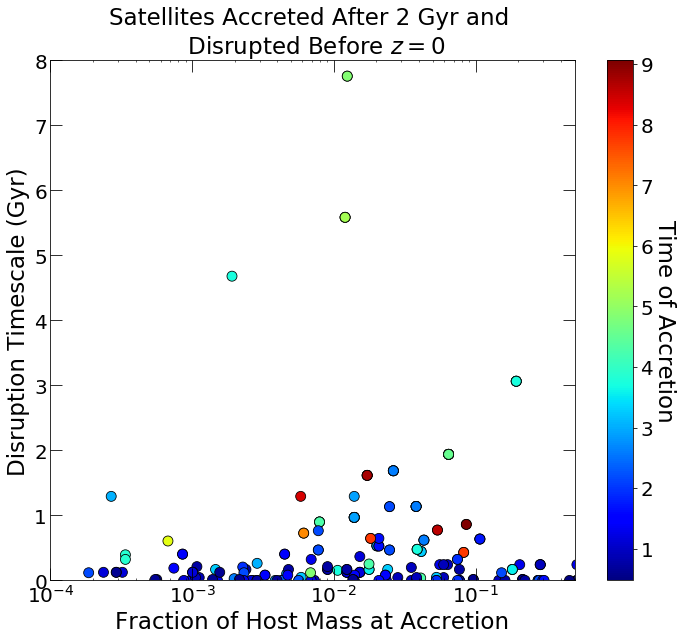

In [15]:
fig, ax4 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(10, 9))
fig.set_facecolor('w')
np.seterr(divide='ignore')

linx=np.linspace(1e-10, 14, 100)
cm = plt.cm.get_cmap('jet')

v = np.zeros(0)
r = np.zeros(0)
d = np.zeros(0)
x = np.zeros(0)
m = np.zeros(0)
#Zombies
for sat in h148_zombies:
    v = np.concatenate((v, infall_velocity(simulation='h148', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h148', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    d = np.concatenate((d, disruption_time(simulation='h148', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)), axis = None)
    x = np.concatenate((x, accretion_time(simulation='h148', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    m = np.concatenate((m, accretion_time(simulation='h148', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
#Zombies
for sat in h229_zombies:
    v = np.concatenate((v, infall_velocity(simulation='h229', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h229', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    d = np.concatenate((d, disruption_time(simulation='h229', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)), axis = None)
    x = np.concatenate((x, accretion_time(simulation='h229', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    m = np.concatenate((m, accretion_time(simulation='h229', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
#Zombies
for sat in h242_zombies:
    v = np.concatenate((v, infall_velocity(simulation='h242', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h242', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    d = np.concatenate((d, disruption_time(simulation='h242', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)), axis = None)
    x = np.concatenate((x, accretion_time(simulation='h242', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    m = np.concatenate((m, accretion_time(simulation='h242', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
#Zombies
for sat in h329_zombies:
    v = np.concatenate((v, infall_velocity(simulation='h329', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h329', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    d = np.concatenate((d, disruption_time(simulation='h329', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)), axis = None)
    x = np.concatenate((x, accretion_time(simulation='h329', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    m = np.concatenate((m, accretion_time(simulation='h329', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
i1 = ax4.scatter((m[(d!=0) & (x>=0)]), 
                 (d - x)[(d!=0) & (x>=0)], c=x[d!=0], #(abs(r/v))[(x[d!=0]>=0)], 
                 s=400, alpha=1, marker='.', edgecolor='k', lw=0.8, cmap=cm)
cbar1 = fig.colorbar(i1, ax=ax4)
cbar1.set_label('Time of Accretion', rotation=270, fontsize=23, labelpad=23)
cbar1.ax.tick_params(labelsize=20)

ax4.set_ylim(0, 8)
ax4.set_xlim(1e-4, 0.5e0)
ax4.set_xscale('log')
ax4.set_title('Satellites Accreted After 2 Gyr and \n Disrupted Before $z=0$', fontsize=23)
ax4.set_ylabel('Disruption Timescale (Gyr)', fontsize=23)
ax4.set_xlabel('Fraction of Host Mass at Accretion', fontsize=23)
ax4.tick_params(which='major', length=12)
ax4.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)

fig.tight_layout()

# all sats, since start of simulation
# colored by time of accretion
# id outliers and look at their orbits

In [5]:
import pynbody
import pynbody.plot.sph as sph
import matplotlib.pylab as plt
from tangos_halo_module.halo_properties import tangos_to_pynbody_halo

s = tangos_to_pynbody_halo(tangos_halo=h148, simulation='h148')
s.physical_units()


In [6]:
pynbody.analysis.angmom.faceon(s)

SimArray([[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]], dtype=float32, 'Msol kpc**-2')

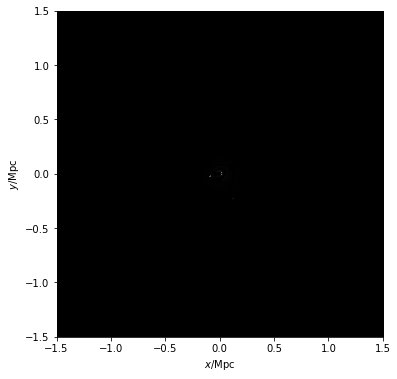

In [10]:
# create the subplots
f, axs = plt.subplots(1,1,figsize=(7,6))

s['pos'].convert_units('Mpc')
sph.velocity_image(s.g, width='3 Mpc', cmap = "Greys_r", mode='stream', units='Msol kpc^-2', 
                   density = 2.0, vector_resolution=100, vmin=1e-1,subplot=axs, 
                   show_cbar=False, vector_color='black')

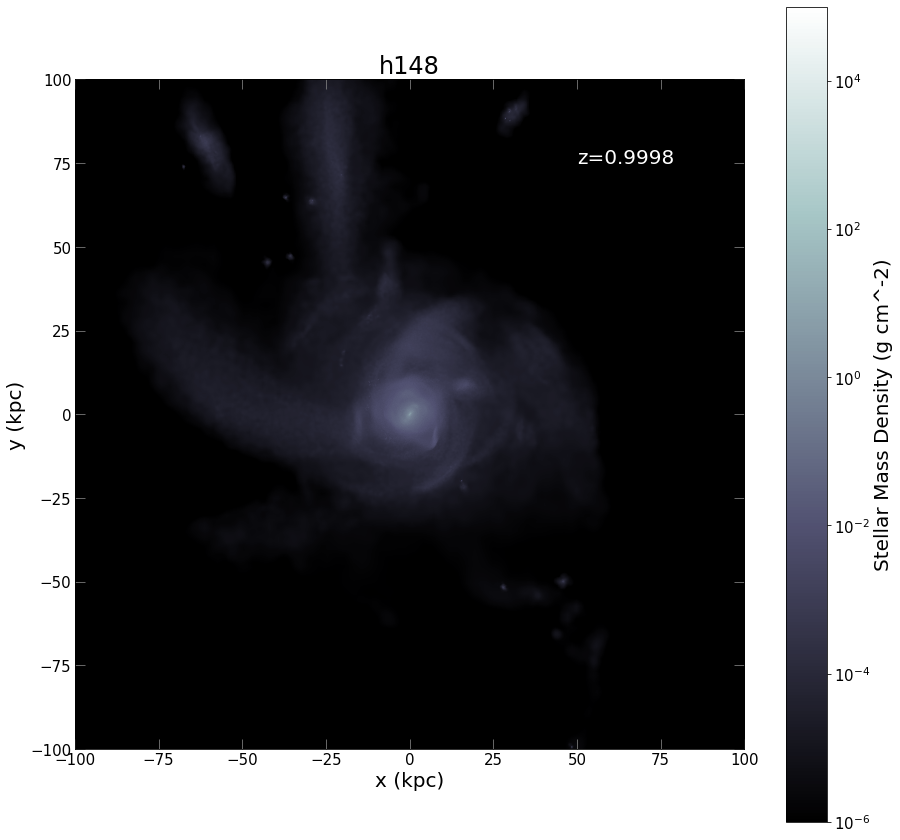

In [10]:
# Check if triad is a group falling in
from tangos_halo_module.images import generate_halo_image
h148b = tangos.get_halo("snapshots/h148.cosmo50PLK.3072g3HbwK1BH.001740/halo_1")
generate_halo_image(tangos_halo=h148b, simulation='h148', view='faceon')

/home/pathakde/MAP2020/mergers/tangos_halo_module/halo_properties.py:502: RuntimeWarning: invalid value encountered in true_divide
  (satz - hostz)**2)**(1/2)
/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in log10


ValueError: x and y must be the same size

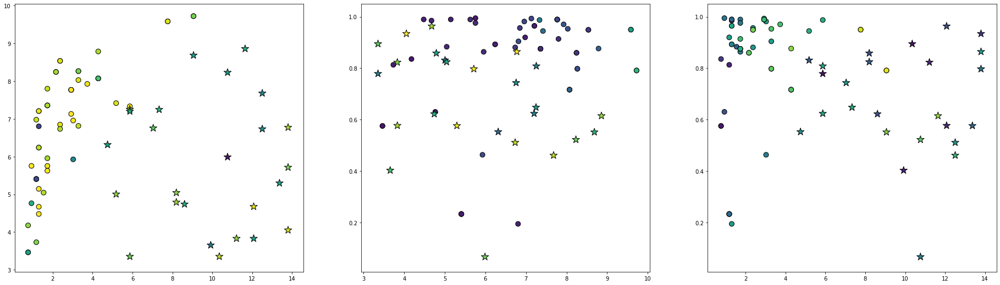

In [4]:
#concatenate for all 4 sims
fig, (ax2, ax3, ax4) = plt.subplots(1, 3, sharex='none', sharey='none', figsize=(32, 9))
fig.set_facecolor('w')
np.seterr(divide='ignore')

linx=np.linspace(1e-10, 14, 100)
cm = plt.cm.get_cmap('viridis')

x = np.zeros(0)
y = np.zeros(0)
z = np.zeros(0)
r = np.zeros(0)
#Zombies
for sat in h148_zombies:
    x = np.concatenate((x, accretion_time(simulation='h148', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    y = np.concatenate((y, accretion_time(simulation='h148', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    z = np.concatenate((z, infall_velocity(simulation='h148', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h148', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
i1 = ax4.scatter(x, abs(r/z), s=80, c=np.log10(y), alpha=1, edgecolor='k', vmin=3, vmax=10, cmap=cm)
i2 = ax3.scatter(np.log10(y), abs(r/z), s=80, c=x, alpha=1, edgecolor='k', vmin=0, vmax=13.9, cmap=cm)
i3 = ax2.scatter(x, np.log10(y), s=80, c=abs(r/z), alpha=1, edgecolor='k', vmin=0, vmax=1, cmap=cm)

#Survivors
x = np.zeros(0)
y = np.zeros(0)
z = np.zeros(0)
r = np.zeros(0)
for sat in h148_survivors:
    x = np.concatenate((x, accretion_time(simulation='h148', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    y = np.concatenate((y, accretion_time(simulation='h148', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    z = np.concatenate((z, infall_velocity(simulation='h148', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h148', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
i11 = ax4.scatter(x, abs(r/z), s=200, c=np.log10(y), alpha=1, marker='*', edgecolor='k', vmin=3, vmax=10, cmap=cm)
i21 = ax3.scatter(np.log10(y), abs(r/z), s=200, c=x, alpha=1, marker='*', edgecolor='k', vmin=0, vmax=13.9, cmap=cm)
i31 = ax2.scatter(x, np.log10(y), s=200, c=abs(r/z), alpha=1, marker='*', edgecolor='k', vmin=0, vmax=1, cmap=cm)

x = np.zeros(0)
y = np.zeros(0)
z = np.zeros(0)
r = np.zeros(0)
#Zombies
for sat in h229_zombies:
    x = np.concatenate((x, accretion_time(simulation='h229', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    y = np.concatenate((y, accretion_time(simulation='h229', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    z = np.concatenate((z, infall_velocity(simulation='h229', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h229', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
i1 = ax4.scatter(x, abs(r/z), s=80, c=np.log10(y), alpha=1, edgecolor='k', vmin=3, vmax=10, cmap=cm)
i2 = ax3.scatter(np.log10(y), abs(r/z), s=80, c=x, alpha=1, edgecolor='k', vmin=0, vmax=13.9, cmap=cm)
i3 = ax2.scatter(x, np.log10(y), s=80, c=abs(r/z), alpha=1, edgecolor='k', vmin=0, vmax=1, cmap=cm)

#Survivors
x = np.zeros(0)
y = np.zeros(0)
z = np.zeros(0)
r = np.zeros(0)
for sat in h229_survivors:
    x = np.concatenate((x, accretion_time(simulation='h229', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    y = np.concatenate((y, accretion_time(simulation='h229', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    z = np.concatenate((z, infall_velocity(simulation='h229', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h229', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
i11 = ax4.scatter(x, abs(r/z), s=200, c=np.log10(y), alpha=1, marker='*', edgecolor='k', vmin=3, vmax=10, cmap=cm)
i21 = ax3.scatter(np.log10(y), abs(r/z), s=200, c=x, alpha=1, marker='*', edgecolor='k', vmin=0, vmax=13.9, cmap=cm)
i31 = ax2.scatter(x, np.log10(y), s=200, c=abs(r/z), alpha=1, marker='*', edgecolor='k', vmin=0, vmax=1, cmap=cm)

x = np.zeros(0)
y = np.zeros(0)
z = np.zeros(0)
r = np.zeros(0)
#Zombies
for sat in h242_zombies:
    x = np.concatenate((x, accretion_time(simulation='h242', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    y = np.concatenate((y, accretion_time(simulation='h242', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    z = np.concatenate((z, infall_velocity(simulation='h242', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h242', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
i1 = ax4.scatter(x, abs(r/z), s=80, c=np.log10(y), alpha=1, edgecolor='k', vmin=3, vmax=10, cmap=cm)
i2 = ax3.scatter(np.log10(y), abs(r/z), s=80, c=x, alpha=1, edgecolor='k', vmin=0, vmax=13.9, cmap=cm)
i3 = ax2.scatter(x, np.log10(y), s=80, c=abs(r/z), alpha=1, edgecolor='k', vmin=0, vmax=1, cmap=cm)

#Survivors
x = np.zeros(0)
y = np.zeros(0)
z = np.zeros(0)
r = np.zeros(0)
for sat in h242_survivors:
    x = np.concatenate((x, accretion_time(simulation='h242', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    y = np.concatenate((y, accretion_time(simulation='h242', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    z = np.concatenate((z, infall_velocity(simulation='h242', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h242', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
i11 = ax4.scatter(x, abs(r/z), s=200, c=np.log10(y), alpha=1, marker='*', edgecolor='k', vmin=3, vmax=10, cmap=cm)
i21 = ax3.scatter(np.log10(y), abs(r/z), s=200, c=x, alpha=1, marker='*', edgecolor='k', vmin=0, vmax=13.9, cmap=cm)
i31 = ax2.scatter(x, np.log10(y), s=200, c=abs(r/z), alpha=1, marker='*', edgecolor='k', vmin=0, vmax=1, cmap=cm)
#ax3.legend(loc='best', fontsize=20, frameon=True)


x = np.zeros(0)
y = np.zeros(0)
z = np.zeros(0)
r = np.zeros(0)
#Zombies
for sat in h329_zombies:
    x = np.concatenate((x, accretion_time(simulation='h329', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    y = np.concatenate((y, accretion_time(simulation='h329', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    z = np.concatenate((z, infall_velocity(simulation='h329', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h329', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
i1 = ax4.scatter(x, abs(r/z), s=80, c=np.log10(y), alpha=1, label='All Disrupted', edgecolor='k', vmin=3, vmax=10, cmap=cm)
i2 = ax3.scatter(np.log10(y), abs(r/z), s=80, c=x, alpha=1, edgecolor='k', vmin=0, vmax=13.9, cmap=cm)
i3 = ax2.scatter(x, np.log10(y), s=80, c=abs(r/z), alpha=1, edgecolor='k', vmin=0, vmax=1, cmap=cm)

cbar1 = fig.colorbar(i1, ax=ax4)
cbar1.set_label('log10 Mass at Accretion ', rotation=270, fontsize=23, labelpad=25)
cbar1.ax.tick_params(labelsize=20)

cbar2 = fig.colorbar(i2, ax=ax3)
cbar2.set_label('Time of Accretion (Gyr)', rotation=270, fontsize=23, labelpad=25)
cbar2.ax.tick_params(labelsize=20)

cbar3 = fig.colorbar(i3, ax=ax2)
cbar3.set_label('$|r/v|$ at Infall (km/s)', rotation=270, fontsize=23, labelpad=25)
cbar3.ax.tick_params(labelsize=20)


#Survivors
x = np.zeros(0)
y = np.zeros(0)
z = np.zeros(0)
r = np.zeros(0)
for sat in h329_survivors:
    x = np.concatenate((x, accretion_time(simulation='h329', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    y = np.concatenate((y, accretion_time(simulation='h329', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    z = np.concatenate((z, infall_velocity(simulation='h329', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[0]), axis = None)
    r = np.concatenate((r, infall_velocity(simulation='h329', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
i11 = ax4.scatter(x, abs(r/z), s=200, c=np.log10(y), alpha=1, label='All Surviving', marker='*', edgecolor='k', vmin=3, vmax=10, cmap=cm)
i21 = ax3.scatter(np.log10(y), abs(r/z), s=200, c=x, alpha=1, marker='*', edgecolor='k', vmin=0, vmax=13.9, cmap=cm)
i31 = ax2.scatter(x, np.log10(y), s=200, c=abs(r/z), alpha=1, marker='*', edgecolor='k', vmin=0, vmax=1, cmap=cm)

ax4.legend(loc='lower center', fontsize=20, frameon=True)
ax4.set_ylim(0, 1)
ax4.set_ylabel('$|r/v|$ at Infall (km/s)', fontsize=25)
ax4.set_xlabel('Time of Accretion (Gyr)', fontsize=25)
ax4.tick_params(which='major', length=12)
ax4.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)

#ax3.legend(loc='lower center', fontsize=20, frameon=True)
ax3.set_ylim(0, 1)
ax3.set_ylabel('$|r/v|$ at Infall (km/s)', fontsize=25)
ax3.set_xlabel('log10 Mass at Accretion ', fontsize=25)
ax3.tick_params(which='major', length=12)
ax3.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)

ax2.set_ylabel('log10 Mass at Accretion', fontsize=25)
ax2.set_xlabel('Time of Accretion (Gyr)', fontsize=25)
ax2.tick_params(which='major', length=12)
ax2.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)

fig.tight_layout()

#try-> color left panel by disruption timescale

In [18]:
def quenching_time(simulation, status, tangos_halo=0, halo_id=0, snap_num=0, threshold=1e-11):
    '''
    input params: 
        simulation: h148, h229, h242, h329: string
        status: 'Zombie', 'Survivor': string
        tangos_halo: 0 or a valid Tangos halo object
        halo_id: halo id: 0 or string or numeric
        snap_num: 0 or 4 digit simulation snapshot number: string
        threshold: threshold in sSFR below which a galaxy is quenched
            [units: /yr]
    output params:
        quenching time: earliest time a satellite falls below the threshold sSFR 
            [units: Gyr since start of simulation]
    '''
    np.seterr(divide='ignore')
    #Host
    path = get_file_path(tangos_halo=0, simulation=simulation, status='Host', halo_id='1', snap_num='4096')
    with h5py.File(path, 'r') as fh:
        t_Gyr = fh['time_|_Gyr'][:]
        hostSFR = fh['SFR_100Myr_|_Msol/yr'][:]
        hostMstar = fh['M_star_|_Msol'][:]
    hostsSFR = hostSFR/hostMstar 
    
    #Satellite
    path = get_file_path(tangos_halo=tangos_halo, simulation=simulation, status=status, halo_id=halo_id, snap_num=snap_num)
    with h5py.File(path, 'r') as f:
        satSFR = f['SFR_100Myr_|_Msol/yr'][:]
        satMstar = f['M_star_|_Msol'][:]
    satsSFR = satSFR/satMstar
    #replace nan and inf values with -1
    satsSFR[satMstar == 0] = -1
    
    if status == 'Survivor':
        if satsSFR[-1] == -1:
            #this survivor has no stars at z=0, so we need to exclude this
            quenching_time = -2
        elif satsSFR[-1]<=threshold and satsSFR[-1]>=0 and satMstar[-1]!=0: 
            #quenched at z=0
                #z=0 stellar mass is non-zero
            #find times when the sSFR transitioned from above to below the threshold
            dips = np.zeros(len(satsSFR))
            for i, val in enumerate(satsSFR):
                if i>0 and satsSFR[i]<=threshold and satsSFR[i-1]>threshold and hostMstar[i]!=satMstar[i] and satMstar[i]!=0 and satsSFR[i]>=0:
                    #sSFR at current timestep is below threshold
                        #sSFR at previous timestep was above threshold
                            #the satellite has not merged with host
                                #current stellar mass is nonzero
                                    #current sSFR is non-negative
                    dips[i]=1
            if len(t_Gyr[dips==1]) != 0:
                #the galaxy has transitioned from star-forming to quiescent at least once before z=0
                #recall that these galaxies are quenched at z=0. so these galaxies have always been below the threshold
                #find the latest time that a galaxy crossed from star-forming to quiescent
                quenching_time = max(t_Gyr[dips==1]) 
            else:
                #this survivor has never transitioned from star-forming to quiescent before z=0
                #recall that these galaxies are quenched at z=0
                #find earliest time the galaxy met the sSFR threshold
                quenching_time = min(t_Gyr[(satsSFR<=threshold) & (satMstar!=0) & (satsSFR>=0)])
                
        else: 
            #this survivor is star-forming at z=0
            quenching_time = -1
            
    elif status == 'Zombie': #disrupted before z=0
        t_disruption = disruption_time(simulation=simulation, status=status, 
                                       tangos_halo=tangos_halo, halo_id=halo_id, snap_num=snap_num)
        if satsSFR[t_Gyr==t_disruption] == -1 or satMstar[-1] == 0:
            #this zombie had no stars at disruption or does not contain a complete track, so we need to exclude this.
            quenching_time = -2
        elif satsSFR[t_Gyr == t_disruption]<=threshold and satMstar[t_Gyr == t_disruption] != 0: 
            #quenched at/before disruption
            #find times when the sSFR transitioned from above to below the threshold
            dips = np.zeros(len(satsSFR))
            for i, val in enumerate(satsSFR):
                if i > 0 and satsSFR[i]<=threshold and satsSFR[i-1]>threshold and hostMstar[i]!=satMstar[i] and satMstar[i]!=0: 
                    #sSFR at current timestep is below threshold
                        #sSFR at previous timestep was above threshold
                            #the satellite has not merged with host
                                #current stellar mass is nonzero
                    dips[i]=1
                    
            if list(set(dips)) == [0]:
                #the galaxy has never transitioned from star-forming to quiescent before disruption
                #recall that these galaxies are quenched at disruption
                #find earliest time the galaxy met the sSFR threshold
                quenching_time = min(t_Gyr[satsSFR<=threshold])
            else:
                #the galaxy has transitioned from star-forming to quiescent at least once before disruption
                #find the latest time that a galaxy crossed from star-forming to quiescent
                quenching_time = max(t_Gyr[dips==1]) 
            
                
        else: 
            #this zombie was star-forming at disruption
            quenching_time = -1
    else:
        #quenching_time = -1
        raise valueError('Halo must be a Survivor or Zombie. Try status = "Zombie" or "Survivor".')
    
    return quenching_time

In [19]:
path = get_file_path(tangos_halo=0, simulation='h148', status='Zombie', halo_id='62', snap_num='0275')
with h5py.File(path, 'r') as f:
    satSFR = f['SFR_100Myr_|_Msol/yr'][:]
    satMstar = f['M_star_|_Msol'][:]
satsSFR = satSFR/satMstar
print('satsSFR', satsSFR)
print('satSFR', satSFR)
print('satMstar', satMstar)
satsSFR[satMstar == 0] = -1
print(satsSFR)

path = get_file_path(tangos_halo=0, simulation='h229', status='Survivor', halo_id='91', snap_num='4096')
with h5py.File(path, 'r') as f:
    satSFR = f['SFR_100Myr_|_Msol/yr'][:]
    satMstar = f['M_star_|_Msol'][:]
satsSFR = satSFR/satMstar
print('satsSFR', satsSFR)
print('satSFR', satSFR)
print('satMstar', satMstar)

satsSFR[satMstar == 0] = -1
satsSFR

satsSFR [           nan 2.17737261e-08 1.70052343e-08 8.68453526e-09
            inf            inf            inf            inf
            inf            inf            inf            inf
            inf            inf            inf            inf
            inf            inf            inf            inf
            inf            inf            inf            inf
            inf            inf            inf            inf
            inf            inf            inf            inf
            inf            inf            inf            inf
            inf            inf            inf            inf
            inf            inf            inf]
satSFR [0.00000000e+00 7.71277685e-04 2.85742800e-03 4.94147329e-03
 1.24660302e-01 1.20576464e-01 1.65956792e+00 9.25842091e-01
 2.40497826e+00 4.86853280e+00 1.33824847e+01 1.31253084e+01
 6.87811406e+00 1.17366736e+01 1.59502460e+01 2.31480671e+01
 3.10178629e+01 3.04285540e+01 2.82007752e+01 3.29929033e+01
 2.97415962e+01 2.51325

/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """
/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in true_divide
  app.launch_new_instance()


array([-1.00000000e+00, -1.00000000e+00, -1.00000000e+00, -1.00000000e+00,
       -1.00000000e+00, -1.00000000e+00, -1.00000000e+00, -1.00000000e+00,
       -1.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  7.37642486e-11,  5.41494672e-10,
        1.68800292e-09,  1.53692627e-09,  3.19484707e-09,  3.34713641e-09,
        1.74555062e-09,  1.14228175e-09,  4.09706131e-10,  9.14899644e-10,
        0.00000000e+00,  3.74981936e-10,  3.90591795e-10,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  2.08631281e-10,  6.22739104e-11,
        1.44064087e-10,  1.15715629e-09,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  

In [20]:
np.seterr(divide='ignore')

quenched = 0
starform = 0
print('h148 Survivors: ')
for sat in h148_survivors:
    print(sat)
    quench_t = quenching_time(simulation='h148', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0, threshold=1e-11)
    print(sat, quench_t)
    if quench_t == -1:
        starform += 1
    else:
        quenched += 1
print('h148 Survivors: ')
print('Quenched: '+ str(quenched))
print('Starform: '+ str(starform))

quenched = 0
starform = 0
print('h229 Survivors: ')
for sat in h229_survivors:
    print(sat)
    quench_t = quenching_time(simulation='h229', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0, threshold=1e-11)
    print(sat, quench_t)
    if quench_t == -1:
        starform += 1
    else:
        quenched += 1
print('h229 Survivors: ')
print('Quenched: '+ str(quenched))
print('Starform: '+ str(starform))

quenched = 0
starform = 0
print('h242 Survivors: ')
for sat in h242_survivors:
    print(sat)
    quench_t = quenching_time(simulation='h242', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0, threshold=1e-11)
    print(sat, quench_t)
    if quench_t == -1:
        starform += 1
    else:
        quenched += 1
print('h242 Survivors: ')
print('Quenched: '+ str(quenched))
print('Starform: '+ str(starform))

quenched = 0
starform = 0
print('h329 Survivors: ')
for sat in h329_survivors:
    print(sat)
    quench_t = quenching_time(simulation='h329', status='Survivor', tangos_halo=sat, halo_id=0, snap_num=0, threshold=1e-11)
    print(sat, quench_t)
    if quench_t == -1:
        starform += 1
    else:
        quenched += 1
print('h329 Survivors: ')
print('Quenched: '+ str(quenched))
print('Starform: '+ str(starform))

h148 Survivors: 
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.004096/halo_779' | NDM=1488 Nstar=1 Ngas=0>
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.004096/halo_779' | NDM=1488 Nstar=1 Ngas=0> 10.35295445377185
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.004096/halo_3' | NDM=1063765 Nstar=294793 Ngas=135161>
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.004096/halo_3' | NDM=1063765 Nstar=294793 Ngas=135161> -1
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.004096/halo_23' | NDM=69956 Nstar=20107 Ngas=16220>
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.004096/halo_23' | NDM=69956 Nstar=20107 Ngas=16220> -1
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.004096/halo_932' | NDM=1229 Nstar=6 Ngas=0>
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.004096/halo_932' | NDM=1229 Nstar=6 Ngas=0> 7.039792779348961
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.004096/halo_36' | NDM=62603 Nstar=25 Ngas=0>
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.004096/halo_36' | NDM=62603 Nstar=25

/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in true_divide
/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in true_divide


<Halo 'snapshots/h229.cosmo50PLK.3072gst5HbwK1BH.004096/halo_24' | NDM=37041 Nstar=973 Ngas=0> 11.645895594949783
<Halo 'snapshots/h229.cosmo50PLK.3072gst5HbwK1BH.004096/halo_191' | NDM=4037 Nstar=120 Ngas=0>
<Halo 'snapshots/h229.cosmo50PLK.3072gst5HbwK1BH.004096/halo_191' | NDM=4037 Nstar=120 Ngas=0> 5.827660459377544
<Halo 'snapshots/h229.cosmo50PLK.3072gst5HbwK1BH.004096/halo_91' | NDM=8607 Nstar=466 Ngas=0>
<Halo 'snapshots/h229.cosmo50PLK.3072gst5HbwK1BH.004096/halo_91' | NDM=8607 Nstar=466 Ngas=0> 7.443836885925717
<Halo 'snapshots/h229.cosmo50PLK.3072gst5HbwK1BH.004096/halo_48' | NDM=20082 Nstar=93 Ngas=0>
<Halo 'snapshots/h229.cosmo50PLK.3072gst5HbwK1BH.004096/halo_48' | NDM=20082 Nstar=93 Ngas=0> 4.534719318139242
<Halo 'snapshots/h229.cosmo50PLK.3072gst5HbwK1BH.004096/halo_89' | NDM=9164 Nstar=3 Ngas=0>
<Halo 'snapshots/h229.cosmo50PLK.3072gst5HbwK1BH.004096/halo_89' | NDM=9164 Nstar=3 Ngas=0> 3.288916656008606
h229 Survivors: 
Quenched: 11
Starform: 0
h242 Survivors: 
<Halo

In [22]:
quenched = 0
starform = 0
print('h148 Zombies: ')
for sat in h148_zombies:
    print(sat)
    quench_t = quenching_time(simulation='h148', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0, threshold=1e-11)
    print(sat, quench_t)
    if quench_t == -1:
        starform += 1
    else:
        quenched += 1
print('h148 Zombies: ')
print('Quenched: '+ str(quenched))
print('Starform: '+ str(starform))

quenched = 0
starform = 0
print('h229 Zombies: ')
for sat in h229_zombies:
    print(sat)
    quench_t = quenching_time(simulation='h229', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0, threshold=1e-11)
    print(sat, quench_t)
    if quench_t == -1:
        starform += 1
    else:
        quenched += 1
print('h229 Zombies: ')
print('Quenched: '+ str(quenched))
print('Starform: '+ str(starform))

quenched = 0
starform = 0
print('h242 Zombies: ')
for sat in h242_zombies:
    print(sat)
    quench_t = quenching_time(simulation='h242', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0, threshold=1e-11)
    print(sat, quench_t)
    if quench_t == -1:
        starform += 1
    else:
        quenched += 1
print('h242 Zombies: ')
print('Quenched: '+ str(quenched))
print('Starform: '+ str(starform))

quenched = 0
starform = 0
print('h329 Zombies: ')
for sat in h329_zombies:
    print(sat)
    quench_t = quenching_time(simulation='h329', status='Zombie', tangos_halo=sat, halo_id=0, snap_num=0, threshold=1e-11)
    print(sat, quench_t)
    if quench_t == -1:
        starform += 1
    else:
        quenched += 1
print('h329 Zombies: ')
print('Quenched: '+ str(quenched))
print('Starform: '+ str(starform))

h148 Zombies: 
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.000225/halo_104' | NDM=9233 Nstar=5 Ngas=2180>
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.000225/halo_104' | NDM=9233 Nstar=5 Ngas=2180> -1
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.001024/halo_21' | NDM=167690 Nstar=33186 Ngas=36631>
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.001024/halo_21' | NDM=167690 Nstar=33186 Ngas=36631> 3.4572683671576527
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.000512/halo_21' | NDM=128142 Nstar=17233 Ngas=37058>
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.000512/halo_21' | NDM=128142 Nstar=17233 Ngas=37058> -1
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.000512/halo_85' | NDM=26597 Nstar=207 Ngas=10276>
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.000512/halo_85' | NDM=26597 Nstar=207 Ngas=10276> -2
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.001408/halo_9' | NDM=431149 Nstar=50520 Ngas=87988>
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.001408/halo_9' | NDM=431149 N

/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in true_divide


<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.000701/halo_49' | NDM=46741 Nstar=2658 Ngas=20764> 2.369716313388101
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.002304/halo_2' | NDM=3672032 Nstar=1545312 Ngas=507625>
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.002304/halo_2' | NDM=3672032 Nstar=1545312 Ngas=507625> -1
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.000347/halo_8' | NDM=162937 Nstar=3152 Ngas=38496>
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.000347/halo_8' | NDM=162937 Nstar=3152 Ngas=38496> -1
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.000974/halo_31' | NDM=104008 Nstar=4343 Ngas=33884>
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.000974/halo_31' | NDM=104008 Nstar=4343 Ngas=33884> -1
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.000640/halo_2' | NDM=1802522 Nstar=92013 Ngas=427942>
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.000640/halo_2' | NDM=1802522 Nstar=92013 Ngas=427942> -1
<Halo 'snapshots/h148.cosmo50PLK.3072g3HbwK1BH.000512/halo_89' | NDM=2

/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in true_divide
/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:68: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.


<Halo 'snapshots/h229.cosmo50PLK.3072gst5HbwK1BH.000384/halo_13' | NDM=59429 Nstar=3833 Ngas=22430> 0.24848475337498746
<Halo 'snapshots/h229.cosmo50PLK.3072gst5HbwK1BH.000288/halo_8' | NDM=93047 Nstar=2701 Ngas=33823>
<Halo 'snapshots/h229.cosmo50PLK.3072gst5HbwK1BH.000288/halo_8' | NDM=93047 Nstar=2701 Ngas=33823> 0.24848475337498746
<Halo 'snapshots/h229.cosmo50PLK.3072gst5HbwK1BH.000192/halo_56' | NDM=7496 Nstar=2 Ngas=2609>
<Halo 'snapshots/h229.cosmo50PLK.3072gst5HbwK1BH.000192/halo_56' | NDM=7496 Nstar=2 Ngas=2609> 0.24848475337498746
<Halo 'snapshots/h229.cosmo50PLK.3072gst5HbwK1BH.000225/halo_87' | NDM=7027 Nstar=19 Ngas=1476>
<Halo 'snapshots/h229.cosmo50PLK.3072gst5HbwK1BH.000225/halo_87' | NDM=7027 Nstar=19 Ngas=1476> 0.24848475337498746
<Halo 'snapshots/h229.cosmo50PLK.3072gst5HbwK1BH.000192/halo_210' | NDM=2044 Nstar=5 Ngas=745>
<Halo 'snapshots/h229.cosmo50PLK.3072gst5HbwK1BH.000192/halo_210' | NDM=2044 Nstar=5 Ngas=745> 0.24848475337498746
<Halo 'snapshots/h229.cosmo50P

/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:71: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.


<Halo 'snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000192/halo_79' | NDM=3475 Nstar=12 Ngas=846> 0.7670080235986579
<Halo 'snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000480/halo_10' | NDM=156702 Nstar=1711 Ngas=21510>
<Halo 'snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000480/halo_10' | NDM=156702 Nstar=1711 Ngas=21510> -1
<Halo 'snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.001344/halo_3' | NDM=1070754 Nstar=67164 Ngas=238981>
<Halo 'snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.001344/halo_3' | NDM=1070754 Nstar=67164 Ngas=238981> -1
<Halo 'snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000480/halo_9' | NDM=155097 Nstar=8255 Ngas=62634>
<Halo 'snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000480/halo_9' | NDM=155097 Nstar=8255 Ngas=62634> -1
<Halo 'snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000384/halo_40' | NDM=11470 Nstar=361 Ngas=8586>
<Halo 'snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000384/halo_40' | NDM=11470 Nstar=361 Ngas=8586> -1
<Halo 'snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000480/halo_22' | NDM

/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in true_divide
/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in true_divide
/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:68: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:71: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:46: RuntimeWarning: invali

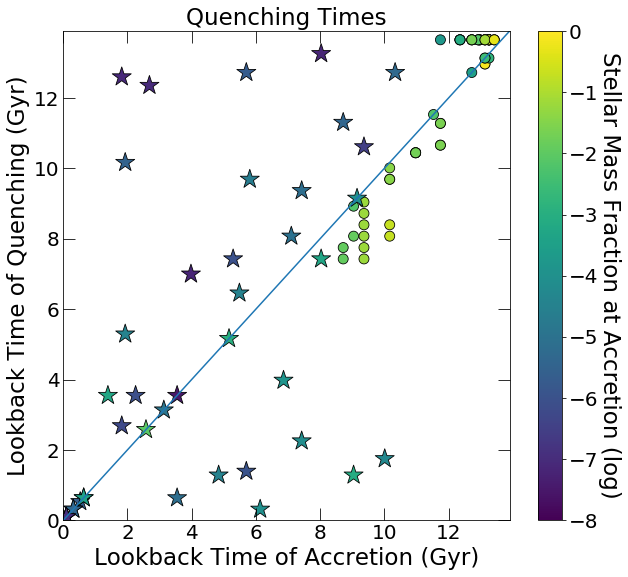

In [27]:
fig, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(10, 9))
fig.set_facecolor('w')
np.seterr(divide='ignore')

linx=np.linspace(1e-10, 14, 100)
cm = plt.cm.get_cmap('viridis')
#________________________________________________________________________________________________________________________#

                                                    #Zombies#
#________________________________________________________________________________________________________________________# 
quench_t = np.zeros(0)
infall_t = np.zeros(0)
infall_m = np.zeros(0)
for sat in h148_zombies:
    quench_t = np.concatenate((quench_t, quenching_time(simulation='h148', status='Zombie', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0, 
                                                        threshold=1e-11)), axis = None)
    infall_t = np.concatenate((infall_t, accretion_time(simulation='h148', status='Zombie', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    infall_m = np.concatenate((infall_m, accretion_time(simulation='h148', status='Zombie', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
for sat in h229_zombies:
    quench_t = np.concatenate((quench_t, quenching_time(simulation='h229', status='Zombie', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0, 
                                                        threshold=1e-11)), axis=None)
    infall_t = np.concatenate((infall_t, accretion_time(simulation='h229', status='Zombie', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    infall_m = np.concatenate((infall_m, accretion_time(simulation='h229', status='Zombie', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
for sat in h242_zombies:
    quench_t = np.concatenate((quench_t, quenching_time(simulation='h242', status='Zombie', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0, 
                                                        threshold=1e-11)), axis=None)
    infall_t = np.concatenate((infall_t, accretion_time(simulation='h242', status='Zombie', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    infall_m = np.concatenate((infall_m, accretion_time(simulation='h242', status='Zombie', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
for sat in h329_zombies:
    quench_t = np.concatenate((quench_t, quenching_time(simulation='h329', status='Zombie', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0, 
                                                        threshold=1e-11)), axis=None)
    infall_t = np.concatenate((infall_t, accretion_time(simulation='h329', status='Zombie', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    infall_m = np.concatenate((infall_m, accretion_time(simulation='h329', status='Zombie', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
i1 = ax1.scatter(13.9-infall_t, 13.9-quench_t, c=np.log10(infall_m),
                 s=400, alpha=1, marker='.', edgecolor='k', lw=0.8, cmap=cm,
                 vmin=-8, vmax=0)
#________________________________________________________________________________________________________________________#

                                                    #Survivors#
#________________________________________________________________________________________________________________________# 
quench_t = np.zeros(0)
infall_t = np.zeros(0)
infall_m = np.zeros(0)
for sat in h148_survivors:
    quench_t = np.concatenate((quench_t, quenching_time(simulation='h148', status='Survivor', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0, 
                                                        threshold=1e-11)), axis=None)
    infall_t = np.concatenate((infall_t, accretion_time(simulation='h148', status='Survivor', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    infall_m = np.concatenate((infall_m, accretion_time(simulation='h148', status='Survivor', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
for sat in h229_survivors:
    quench_t = np.concatenate((quench_t, quenching_time(simulation='h229', status='Survivor', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0, 
                                                        threshold=1e-11)), axis=None)
    infall_t = np.concatenate((infall_t, accretion_time(simulation='h229', status='Survivor', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    infall_m = np.concatenate((infall_m, accretion_time(simulation='h229', status='Survivor', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
for sat in h242_survivors:
    quench_t = np.concatenate((quench_t, quenching_time(simulation='h242', status='Survivor', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0, 
                                                        threshold=1e-11)), axis=None)
    infall_t = np.concatenate((infall_t, accretion_time(simulation='h242', status='Survivor', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    infall_m = np.concatenate((infall_m, accretion_time(simulation='h242', status='Survivor', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)
for sat in h329_survivors:
    quench_t = np.concatenate((quench_t, quenching_time(simulation='h329', status='Survivor', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0, 
                                                        threshold=1e-11)), axis=None)
    infall_t = np.concatenate((infall_t, accretion_time(simulation='h329', status='Survivor', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0)[1]), axis = None)
    infall_m = np.concatenate((infall_m, accretion_time(simulation='h329', status='Survivor', 
                                                        tangos_halo=sat, halo_id=0, snap_num=0)[2]), axis = None)

i1 = ax1.scatter(13.9-infall_t, 13.9-quench_t, c=np.log10(infall_m),
                 s=400, alpha=1, marker='*', edgecolor='k', lw=0.8, cmap=cm,
                 vmin=-8, vmax=0)
ax1.plot(linx, linx)
cbar1 = fig.colorbar(i1, ax=ax1)
cbar1.set_label('Stellar Mass Fraction at Accretion (log)', rotation=270, fontsize=23, labelpad=23)
cbar1.ax.tick_params(labelsize=20)

ax1.set_ylim(0, 13.9)
ax1.set_xlim(0, 13.9)
ax1.set_title('Quenching Times', fontsize=23)
ax1.set_ylabel('Lookback Time of Quenching (Gyr)', fontsize=23)
ax1.set_xlabel('Lookback Time of Accretion (Gyr)', fontsize=23)
ax1.tick_params(which='major', length=12)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)

